In [1]:
# Load the Libraries that we will be using
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score

# hide warnings
import warnings
warnings.filterwarnings('ignore')

# expand some of the output settings
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)


# Data Load

In [2]:
# Load the data from the provided dataset
df = pd.read_csv("D:/Repos/MSC_Machine_Learning_and_AI/03 - Machine Learning 2/02-Assignment-AdvancedRegression/train.csv")

# Data Exploration

In [3]:
# Lets check the size of the data source
df.shape

(1460, 81)

### We have 1460 rows and 81 columns

In [4]:
#  Quickly check that the values look reasonable when compared to the CSV
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### All the values look ok

In [5]:
# Lets check the split of the data types and the number of nulls
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

### Looking at the data description there are a few fields that 
### need to be adjusted or removed 
###
### first let's check for duplicates.  if none exist then the id column can be dropped.

In [6]:
# check for duplicates
print(df.duplicated().sum(), "duplicates found")

0 duplicates found


In [7]:
df.drop(['Id'], axis=1, inplace=True)

### MSSubClass and MoSold fields are categorical with a data type of numeric
### change the type of data to categorical.

In [8]:
# converting MSSubClass to categorical
df['MSSubClass'] = df['MSSubClass'].map({   20:'c20'
                                            ,30:'c30'
                                            ,40:'c40'
                                            ,45:'c45'
                                            ,50:'c50'
                                            ,60:'c60'
                                            ,70:'c70'
                                            ,75:'c75'
                                            ,80:'c80'
                                            ,85:'c85'
                                            ,90:'c90'
                                            ,120:'c120'
                                            ,150:'c150'
                                            ,160:'c160'
                                            ,180:'c180'
                                            ,190:'c190'})

# converting MoSold to categorical
df['MoSold'] = df['MoSold'].map({   1:'Jan'
                                    ,2:'Feb'
                                    ,3:'Mar'
                                    ,4:'Apr'
                                    ,5:'May'
                                    ,6:'Jun'
                                    ,7:'July'
                                    ,8:'Aug'
                                    ,9:'Sep'
                                    ,10:'Oct'
                                    ,11:'Nov'
                                    ,12:'Dec'})



In [9]:
# define a font to be used later
header_font = {'family': 'serif',
    'color':  '#6D2463',
    'weight': 'bold',
    'size': 15
    } 

# lets define some functions to visualise
# the numeric and categorical feature

def continuous_summary(df, col, target):
    """ Show visualisations for continuous data
        these include
           - metadata (data type and unique values)
           - statistics (count, max etc.)
           - Boxplot showing distribution of loans
           - histogram showing distribution of loans
           - regplot of the feature against the dependant variable
    """
 
    # define the value to use for the number of bins
    count = len(df[col].unique())
    if (count > 35):
         count = 35

    # Calculate some values needed
    nulls = round(df[col].isnull().sum(),0)
    pct_nulls = round((nulls/len(df.index)*100),2)
    desc = pd.DataFrame(df[col].describe())
    desc[col] = round(desc[col])
    
    IQR = (desc.loc["75%"]- desc.loc["25%"])
    LB = round(desc.loc["25%"] - (IQR * 1.6),2)
    UB = round(desc.loc["75%"] + (IQR * 1.6),2)
    
    low_outliers = len(df[(df[col] < float(LB))])
    pct_low_outliers = round((low_outliers/len(df.index)*100),2)
    high_outliers = len(df[(df[col] > float(UB))])
    pct_high_outliers = round((high_outliers/len(df.index)*100),2)
    mode = df[col].mode()[0]

    # set the style     
    plt.style.use('bmh')

    # set up the plot layout
    fig = plt.figure(figsize=(15,4.3))
    ax1 = plt.subplot2grid((2,5), (0,0))                           # top left
    ax2 = plt.subplot2grid((2,5), (0,1), colspan=2)                # top mid
    ax3 = plt.subplot2grid((2,5), (1,0))                           # bottom left
    ax4 = plt.subplot2grid((2,5), (1,1), colspan=2)                # bottom mid
    ax5 = plt.subplot2grid((2,5), (0,3), rowspan=2, colspan=2)     # right

    # Metadata
    ax1.text(0.05, 0.99, col, transform=ax1.transAxes,horizontalalignment='right',verticalalignment='center',fontdict= header_font)
    ax1.text(0.5, 0.7, 'Data Type:   ' + str(df[col].dtype) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.5, 0.6, '# Unique Values:  ' + str(len(df[col].unique())) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.1, 0.5, '# Nulls:  ' + str(nulls) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.1, 0.4, '% Nulls:  ' + str(pct_nulls) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.8, 0.5, 'Mode:  ' + str(mode) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.8, 0.4, '% Mode:  ' + str(round(len(df[(df[col]==mode)])/len(df.index)*100,2)) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.10, 0.25, '# Low Outliers:  ' + str(low_outliers) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.80, 0.25, '% Low Outliers:  ' + str(pct_low_outliers) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.10, 0.15, '# High Outliers:  ' + str(high_outliers) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.80, 0.15, '% High Outliers:  ' + str(pct_high_outliers) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.axis('off')
    ax1.axis('tight')

    # box plot
    sns.boxplot(data=df, x=col, ax=ax2)
    ax2.set_title('Distribution of ' + col + ' for all observations')
    ax2.xaxis.set_visible(False)

    # stats table
    table = ax3.table(cellText=desc.values, colLabels=desc.columns, rowLabels=desc.index, loc='center',cellLoc='center' )
    ax3.axis('off')
    ax3.axis('tight')

    # histogram
    sns.histplot(data=df, x=col, bins=count, ax=ax4)
    fig.tight_layout()

    #Regplot
    sns.regplot(data =df,x=col,y=target,ax=ax5 ).set(title='Regplot')

    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    # Display the plot
    plt.show() 

def segmented_summary(df, col, target):
    """ Show visualisations for segmented data
        these include
           - bar chart displaying # observations per category
           - box plots showing category distribution against the target variable
           - a series of statistics regarding the highest and lowest % default categories
    """

    # set the style     
    plt.style.use('bmh')

    # Calculate some values needed
    nulls = round(df[col].isnull().sum(),0)
    pct_nulls = round((nulls/len(df.index)*100),0)
    mode = df[col].mode()[0]

    # set up the plot layout
    fig = plt.figure(figsize=(9,12))
    fig.tight_layout()
    ax1 = plt.subplot2grid((10,1), (0,0))     # top 
    ax2 = plt.subplot2grid((10,1), (1,0),rowspan=2)     # middle
    ax3 = plt.subplot2grid((10,1), (3,0),rowspan=7)     # bottom
  

    # Metadata
    ax1.text(0.05, 0.90, col, transform=ax1.transAxes,horizontalalignment='right',verticalalignment='center',fontdict= header_font)
    ax1.text(0.4, 0.8, 'Data Type:   ' + str(df[col].dtype) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.4, 0, '# Unique Values:  ' + str(len(df[col].unique())) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.6, 0.8, '# Nulls:  ' + str(nulls) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.6, 0, '% Nulls:  ' + str(pct_nulls) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.8, 0.8, 'Mode:  ' + str(mode) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.text(0.8, 0, '% Mode:  ' + str(round(len(df[(df[col]==mode)])/len(df.index)*100,2)) , transform=ax1.transAxes, fontsize=10,horizontalalignment='center',verticalalignment='center')
    ax1.axis('tight')
    ax1.axis('off')

    # group frequency
    df[col].value_counts().plot.bar(ax=ax2)
    ax2.set_xlabel(col)
    ax2.set_ylabel('# observations')
    ax2.set_title('Number of observations by ' + col)
    ax2.axis('auto')
    ax2.set_xlabel('')

    # group default frequency
    sns.boxplot(data=df,y=col, x=target)
    ax3.set_title(target + ' distribution by category')
    ax3.axis('auto')

    plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=1.0)
    plt.show()

# create a simple correlation matrix that excludes rows whose correlation 
# with other rows does not exceed a defined threshold (default 0.8)
def simplecorr(df, threshold=0.8):
    cor = df.corr()
    keep_cols = []
    for col in cor.index:
        
        if len(cor[(abs(cor[col]>threshold))]) > 1: # it will always correlate with itself
            keep_cols.append(col)
    
    # need to invert the keep_cols to get the cols to drop
    remove_cols = list(cor.index)
    for c in keep_cols:
        remove_cols.remove(c)

    cor.drop(remove_cols, axis = 1,inplace=True)
    cor.drop(remove_cols, axis = 0,inplace=True)
    return cor


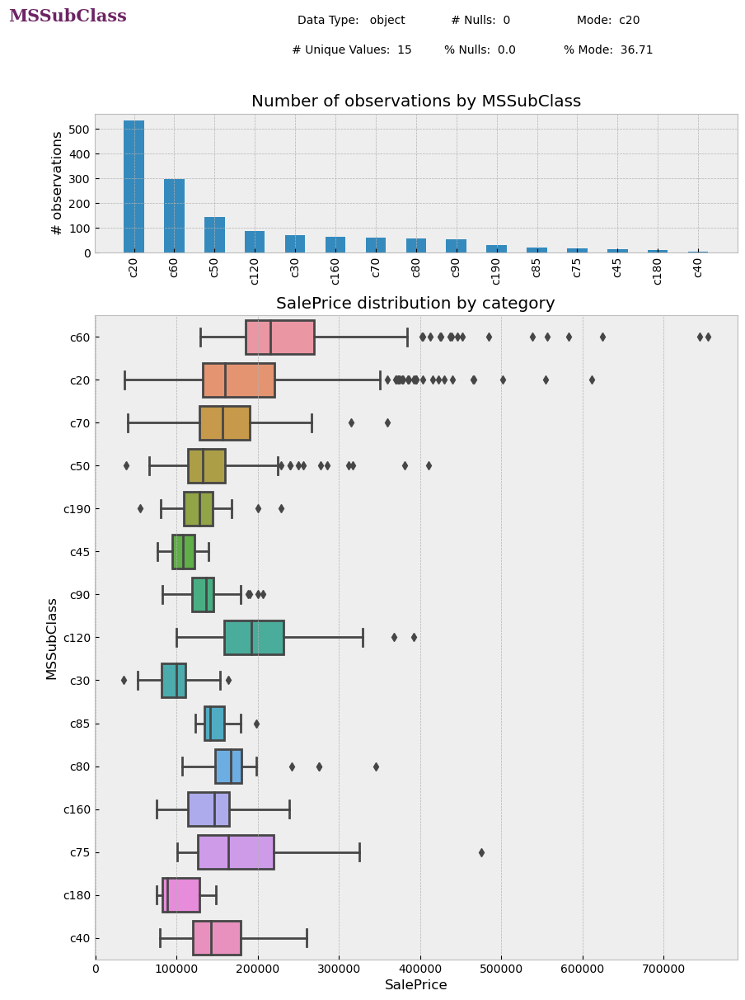

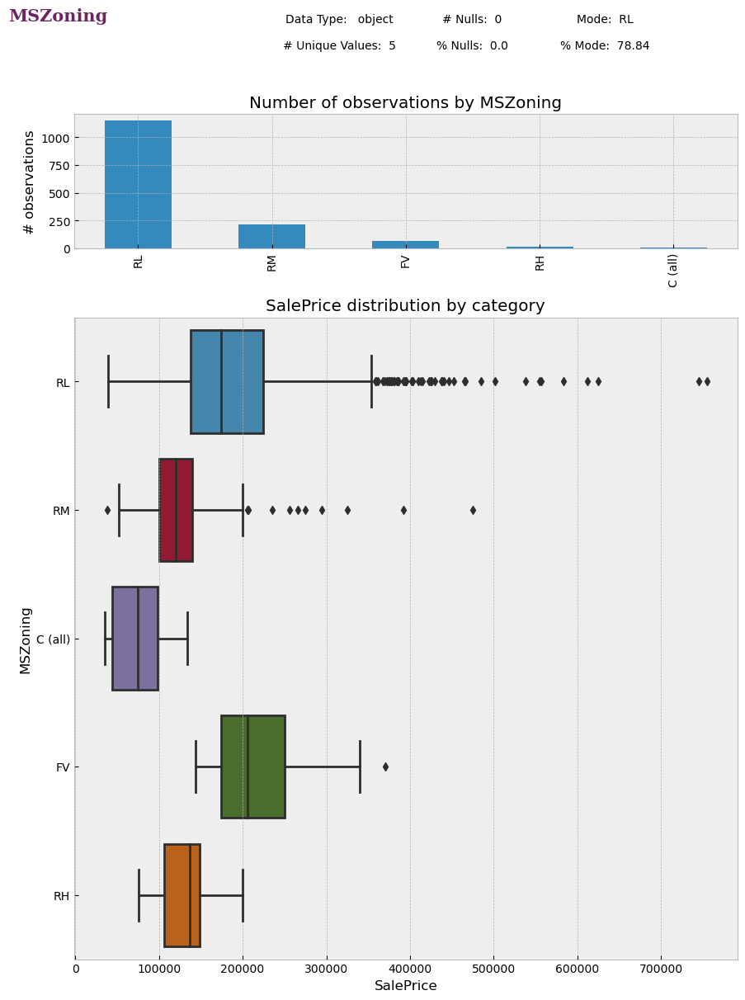

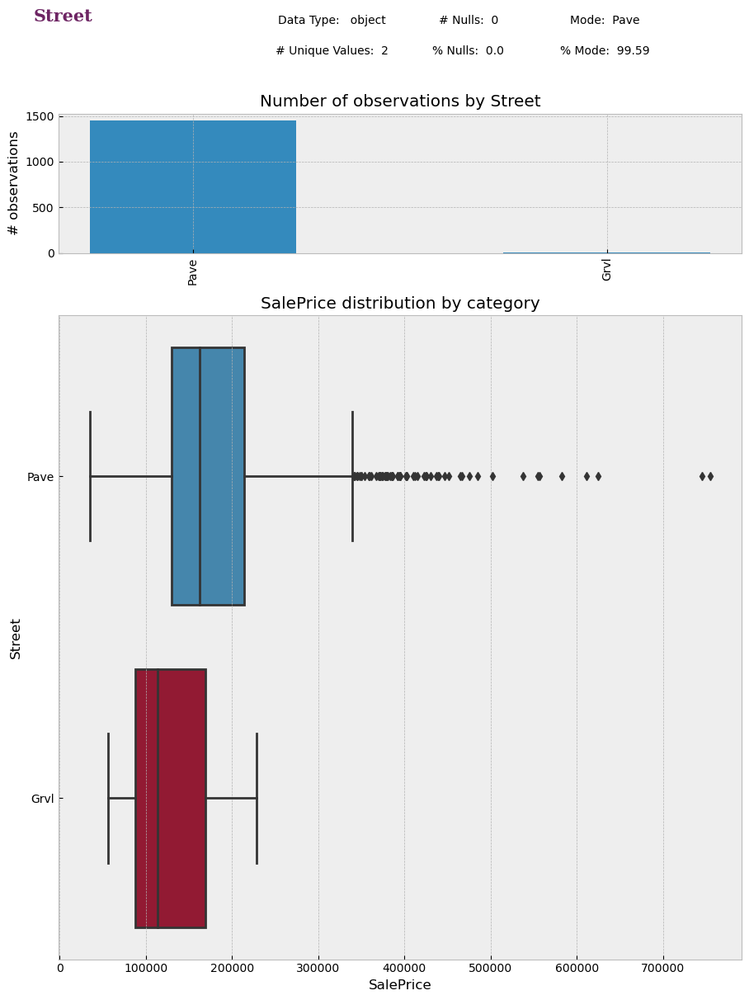

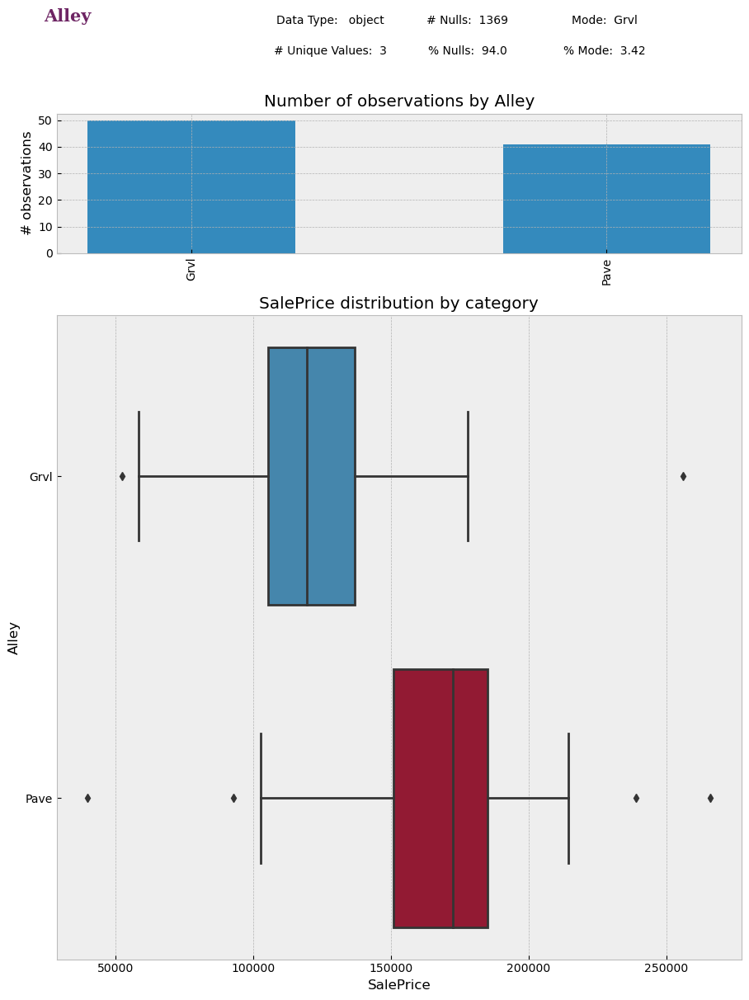

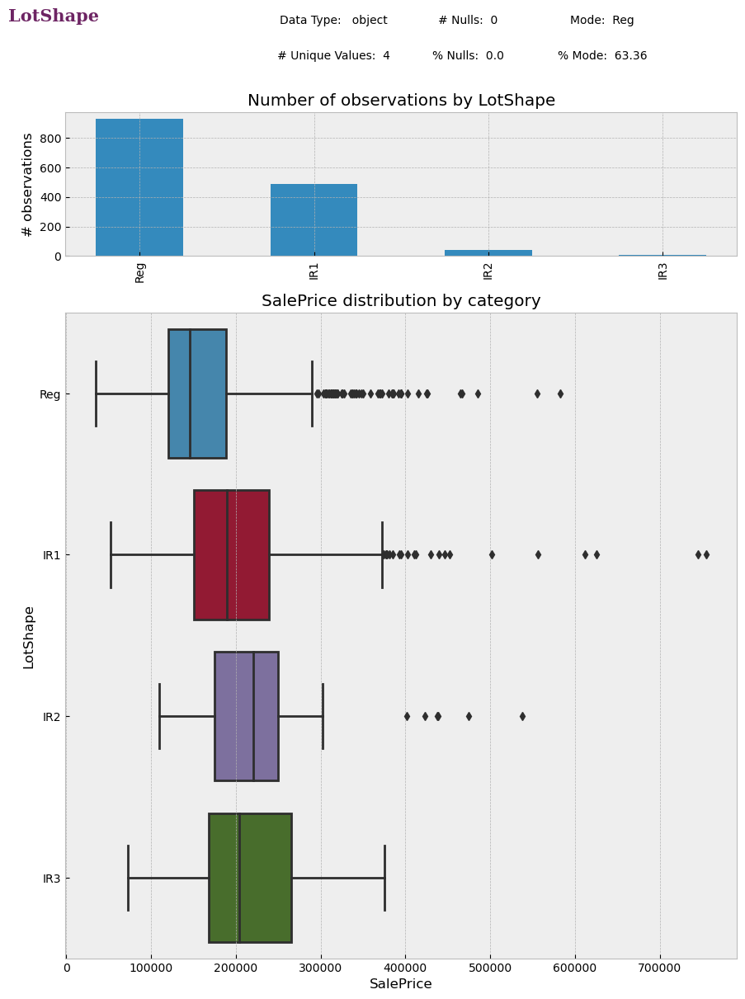

...

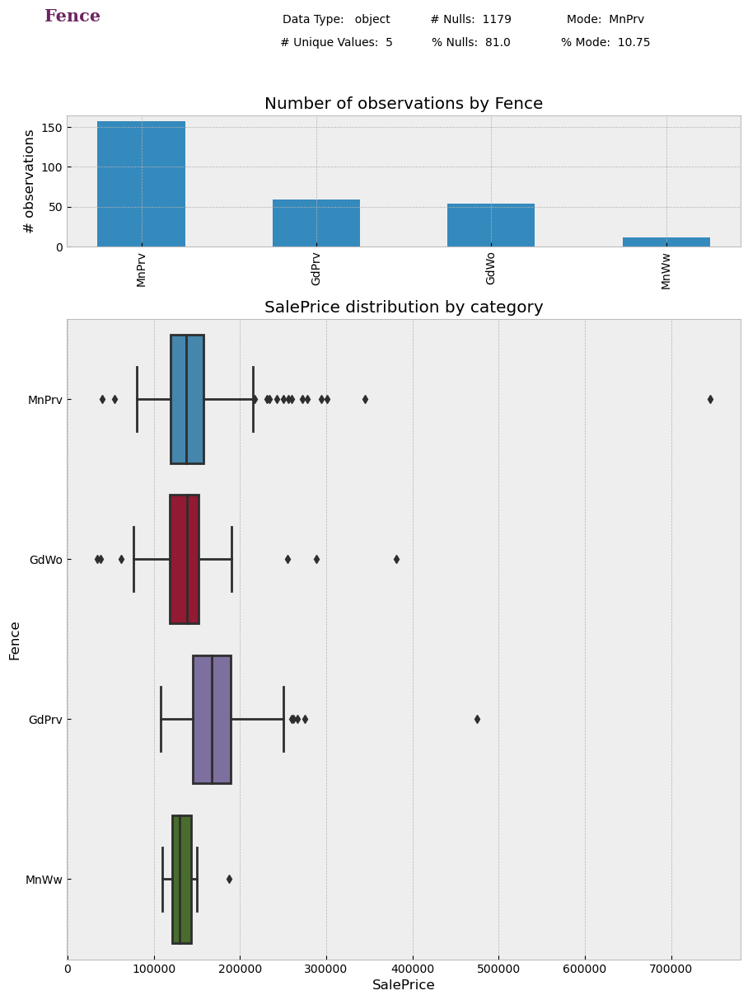

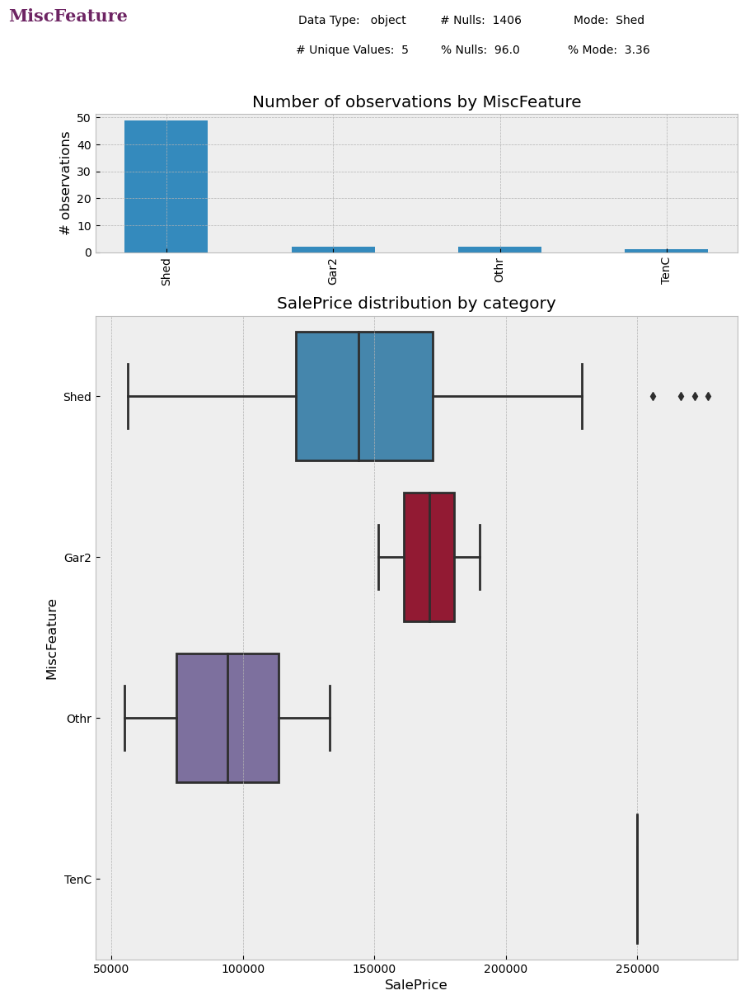

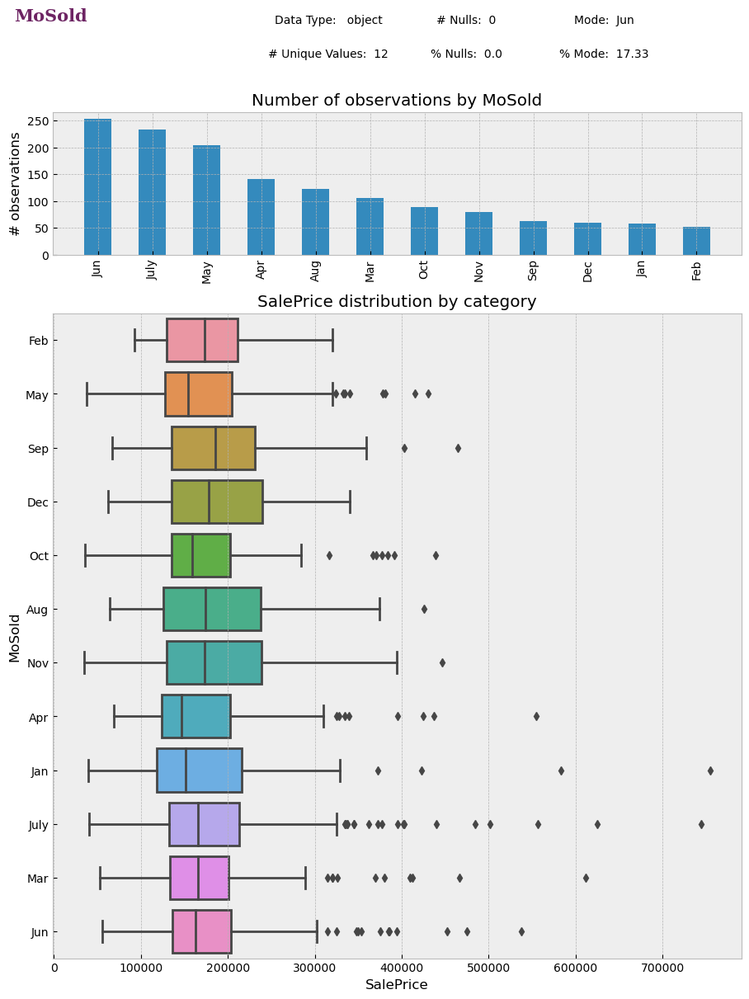

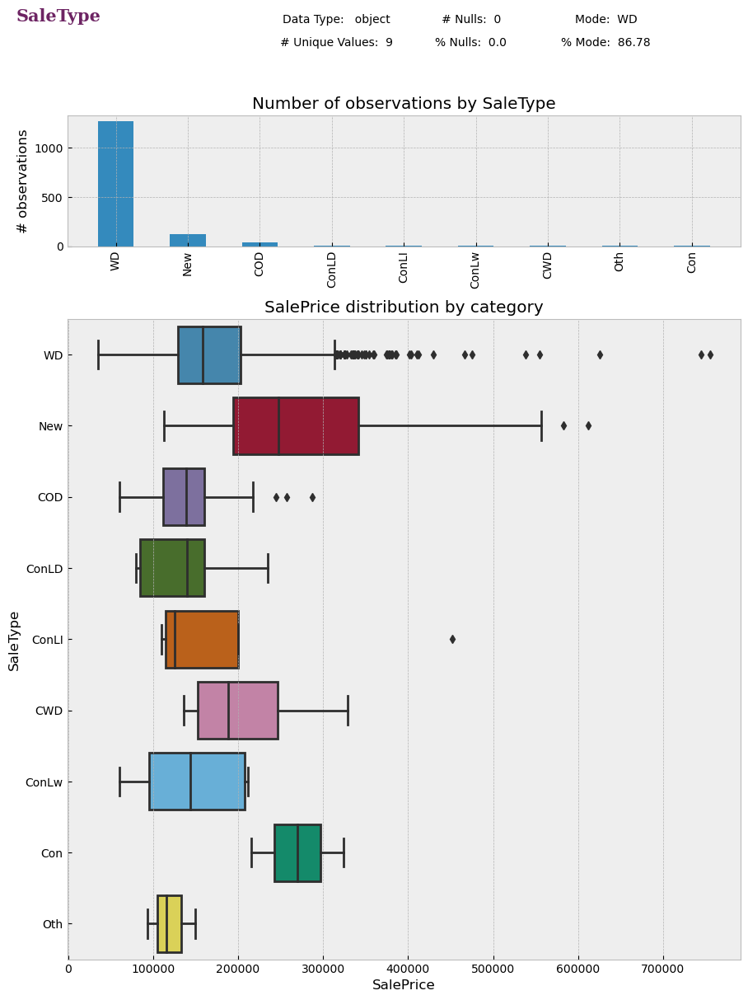

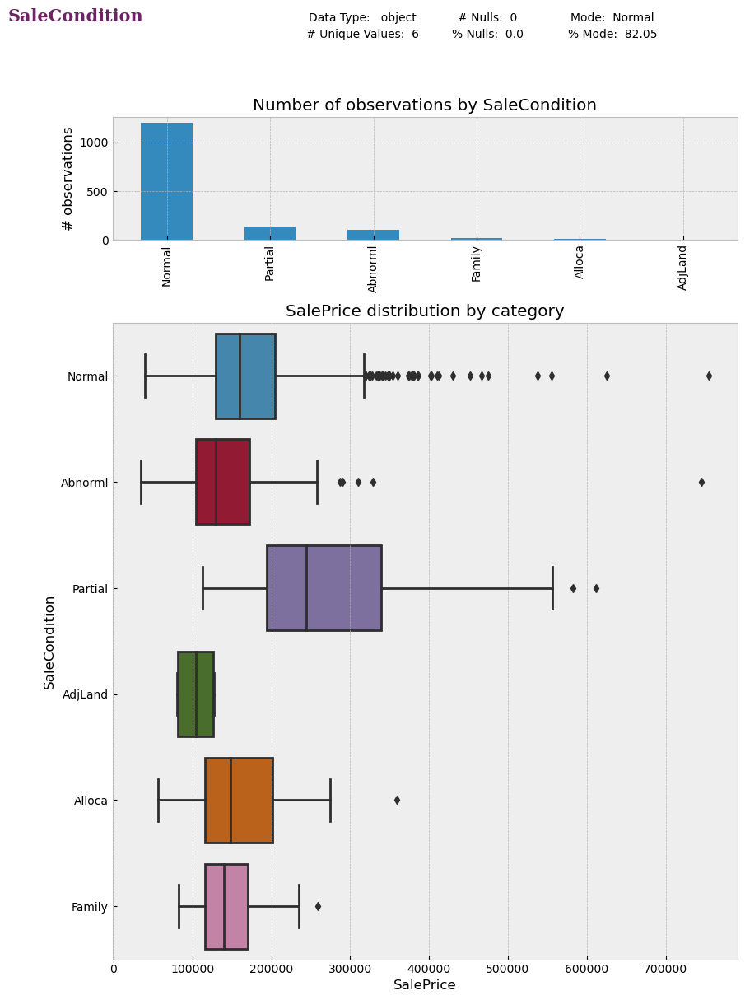

In [10]:
### Lets look at the categorical fields in detail
for col in list(df.select_dtypes(include=['object']).columns.values.tolist()):
    segmented_summary(df,col,'SalePrice')

### Looking at the data there are a lot of outliers but looking at the data it's impossible to identify 
### which of these are valid outliers that are important and any that are eroneous data.  We will keep all the data

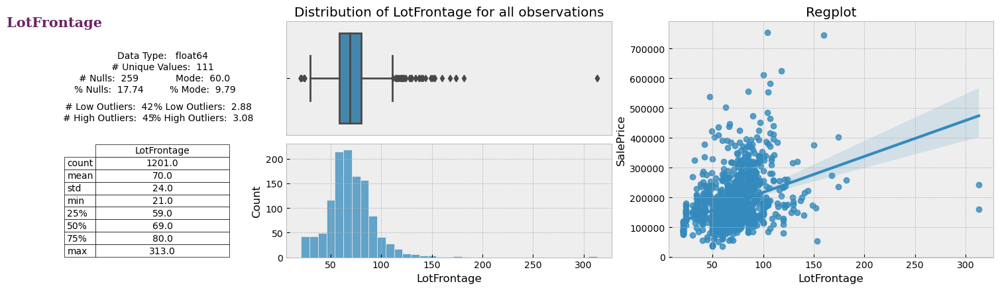

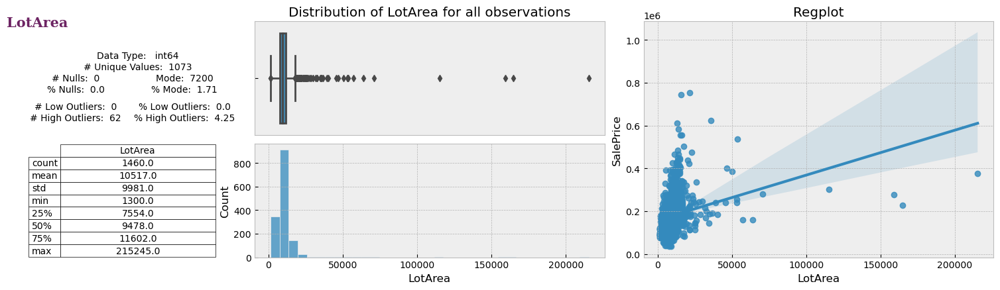

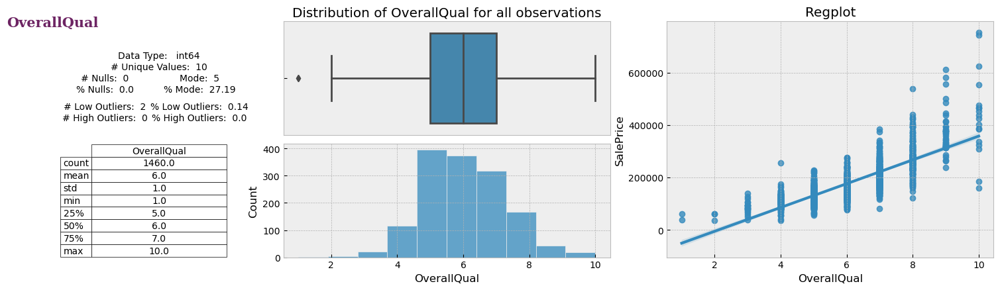

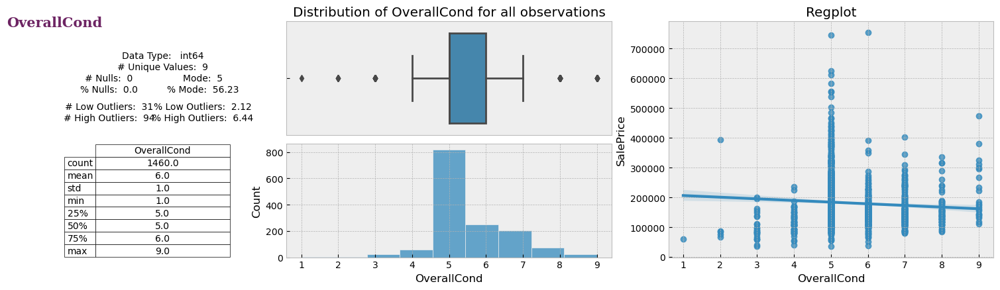

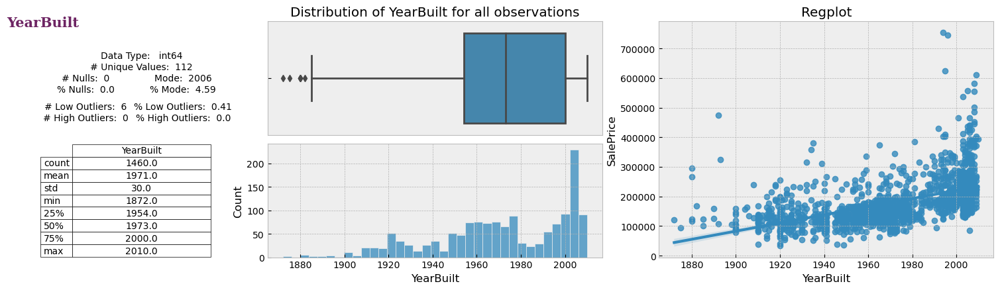

...

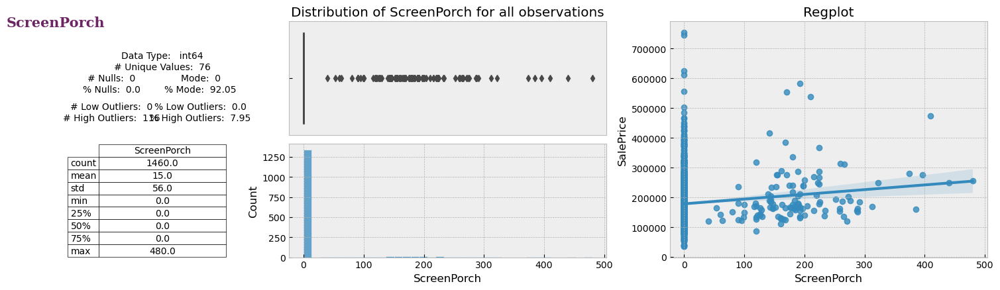

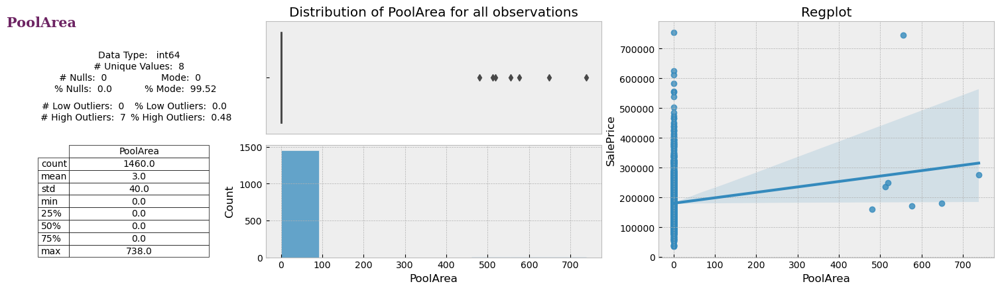

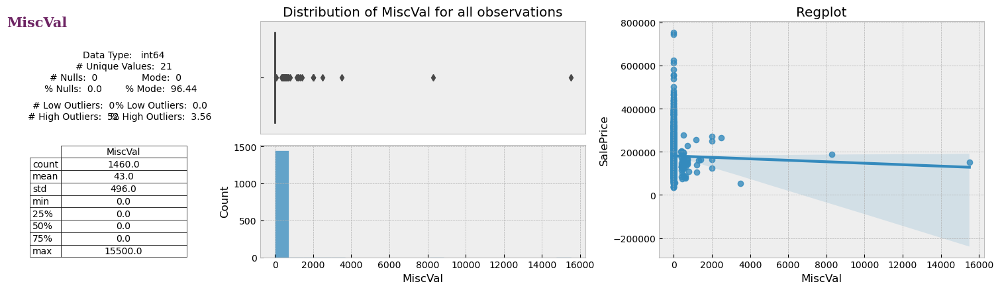

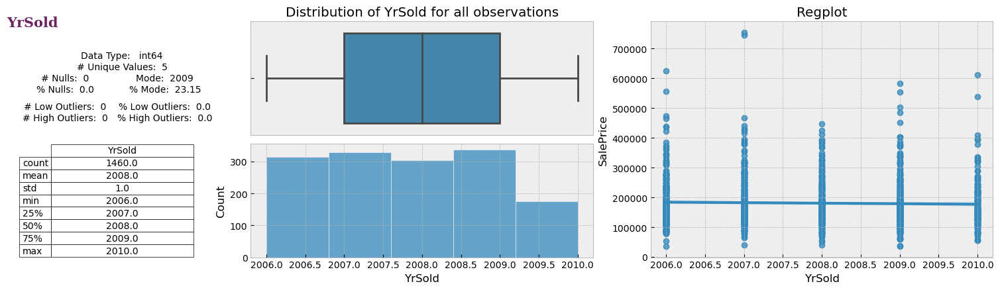

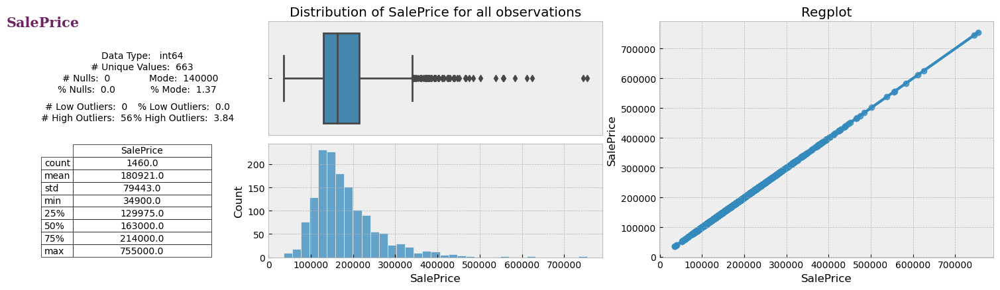

In [11]:
### Lets look at the numerical fields in detail
for col in list(df.select_dtypes(include=['int16','int64','float64']).columns.values.tolist()):
    continuous_summary(df,col,'SalePrice')

# Data Cleansing

In [12]:
# looking at the plots there are several with either
#   - the mode accounting for > 90% of observations
#   - over 90% null
# lets drop these features

# drop the categorical features
df.drop(['Street','Alley','Utilities','LandSlope','RoofMatl','Heating','CentralAir','Condition2','Electrical','Functional','GarageCond','PavedDrive','PoolQC','MiscFeature'], axis=1, inplace=True)

# drop the numeric features
df.drop(['LowQualFinSF','KitchenAbvGr','3SsnPorch','ScreenPorch','PoolArea','MiscVal'], axis=1, inplace=True)

# All other fields that contain nulls will be handled when creating dummy features

# Lets also drop family sales as these are likely to sell for less than market value.
df = df[~(df['SaleCondition']=='Family')]

### There are some fields where the description 
### states that null values have a particular meaning. 
### We can create a new category for these nulls

In [13]:
cols = ['BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Fence','FireplaceQu','GarageType','GarageFinish','GarageQual']

for i in range(len(cols)):
    df[cols[i]].fillna('None',inplace=True)

### There are three continuous features that contain nulls 
### These are:
 - LotFrontage
 - GarageYrBlt
 - MasVnrArea

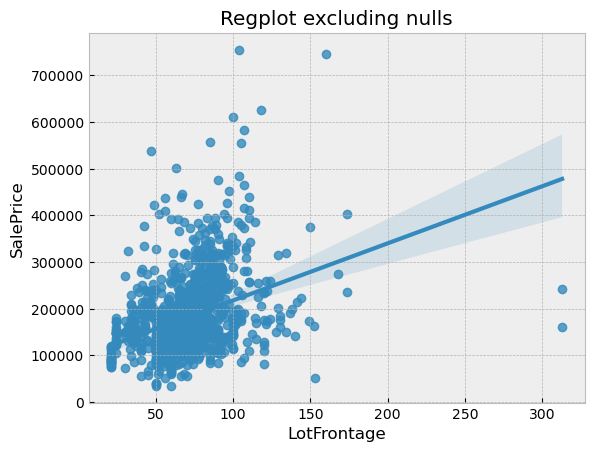

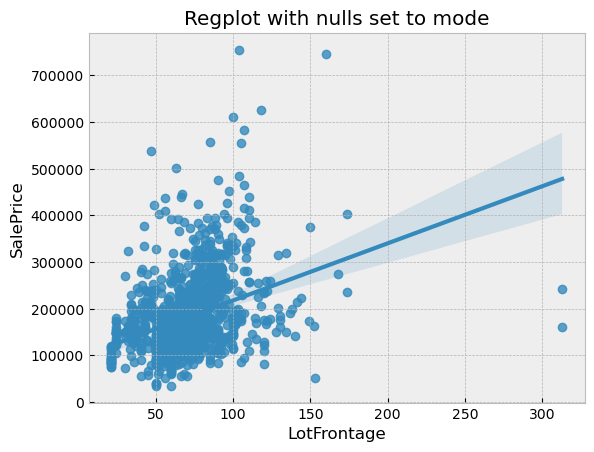

In [14]:
# lets look at LotFrontage
# What would happen if we set the nulls to the mode value
sns.regplot(df,x='LotFrontage',y='SalePrice').set(title='Regplot excluding nulls' )
plt.show()

sns.regplot(x=df['LotFrontage'].fillna(df['LotFrontage'].mode()),y=df['SalePrice']).set(title='Regplot with nulls set to mode')
plt.show()

### The change to the regplot looks minimal
### lets fill the nulls with the mode value.

In [15]:
df['LotFrontage'].fillna(df['LotFrontage'].mode()[0],inplace=True)

In [16]:
# lets look at GarageYrBlt
# looking at the GarageType field above we can see there are 81 properties without a garage
# That matches the number of null 
print('# null GarageYrBlt observations = :',len(df[(df['GarageYrBlt'].isnull() == True)]))

# lets assume that the order of desirability would be:
# No garage -> old garage -> New garage
# Based on this lets set the GarageYrBlt nulls to the minimum value 
df['GarageYrBlt'].fillna(df['GarageYrBlt'].min(),inplace=True)


# null GarageYrBlt observations = : 81


In [17]:
# Lets look at MasVnrArea
# Looking at the feature summary it only has 8 null observations
# Lets just drop these rows.
print('# null observations = :',len(df[(df['MasVnrArea'].isnull() == True)]))
df = df[(df['MasVnrArea'].isnull() == False)]


# null observations = : 8


In [18]:

print('# null LotFrontage observations = :',len(df[(df['LotFrontage'].isnull() == True)]))
print('# null GarageYrBlt observations = :',len(df[(df['GarageYrBlt'].isnull() == True)]))
print('# null MasVnrArea observations = :',len(df[(df['MasVnrArea'].isnull() == True)]))

# null LotFrontage observations = : 0
# null GarageYrBlt observations = : 0
# null MasVnrArea observations = : 0


# Feature Engineering

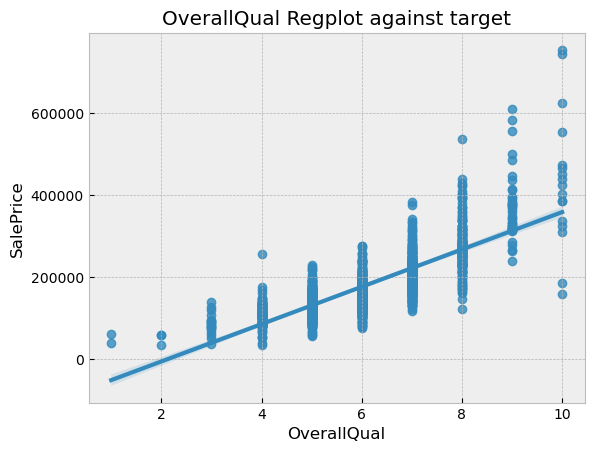

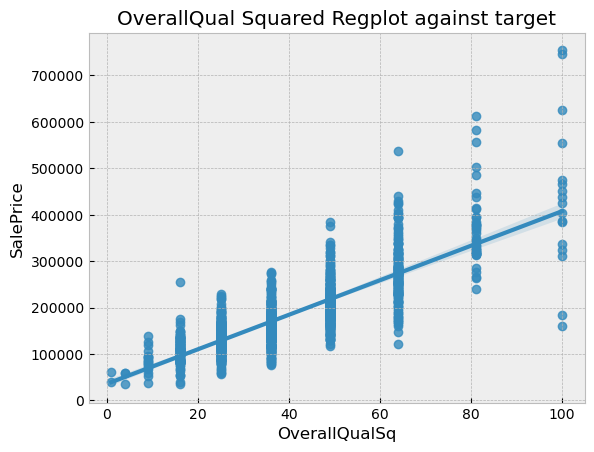

In [19]:
# looking at the OverallQual feature, there appears to be a non-linear relationship
sns.regplot(df,x='OverallQual',y='SalePrice').set(title='OverallQual Regplot against target' )
plt.show()

# The curve appears to indicate that there's a square relationship f(x)=x^2
# Lets create a new feature
df['OverallQualSq'] = np.square(df['OverallQual'])

# Now lets check the fit of the new feature
sns.regplot(df,x='OverallQualSq',y='SalePrice').set(title='OverallQual Squared Regplot against target' )
plt.show()


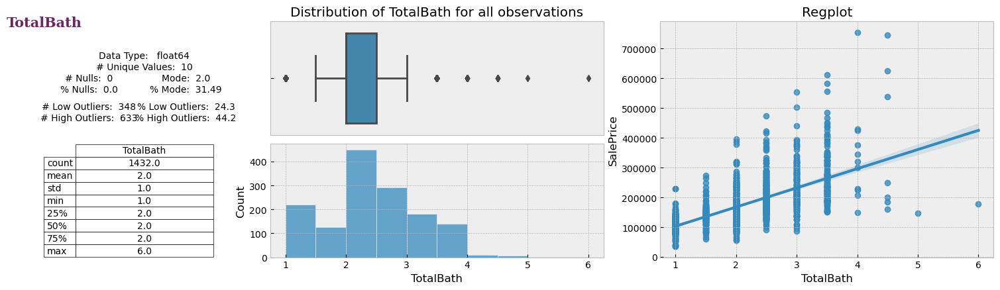

In [20]:
# Lets create some more features based on knowledge of the data

# houses have all different configuration of bathrooms
# There is no feature for the total number of bathrooms
# lets create a feature that sums the total number of bathrooms
df['TotalBath'] = df['BsmtFullBath'] +	(0.5*df['BsmtHalfBath']) +	df['FullBath']+	(0.5*df['HalfBath'])

continuous_summary(df,'TotalBath','SalePrice')

### There are several fields that are rated using strings
### These ordinal categorical fields can be mapped to continuous data 
 
    -   Ex	Excellent -> 5
    -   Gd	Good -> 4
    -   TA	Average/Typical -> 3
    -   Fa	Fair -> 2
    -   Po	Poor  -> 1
    -   NA/nulls -> 0 

### There are also some slightly different ordinal fields

       - Gd	    Good Exposure -> 4
       - Av	    Average Exposure (split levels or foyers typically score average or above) -> 3
       - Mn	    Mimimum Exposure -> 2
       - No	    No Exposure -> 1
       - NA	    No Basement -> 0

       - GLQ	Good Living Quarters -> 6
       - ALQ	Average Living Quarters -> 5
       - BLQ	Below Average Living Quarters -> 4	
       - Rec	Average Rec Room -> 3
       - LwQ	Low Quality -> 2
       - Unf	Unfinshed -> 1
       - NA	    No Basement -> 0

       - Fin	Finished -> 3
       - RFn	Rough Finished -> 2	
       - Unf	Unfinished -> 1
       - NA	    No Garage -> 0

### all observations with the same value map to the same number e.g. 'Gd' always maps to 4
### we can use one map function for all of the features

In [21]:
# lets create a list of the fields that use this format
ordinal_rating_fields = ['ExterQual','ExterCond','BsmtExposure','BsmtFinType1','BsmtFinType2','BsmtQual','BsmtCond','GarageFinish', 'HeatingQC','KitchenQual','FireplaceQu','GarageQual']

print('Before')
print(df[ordinal_rating_fields].head())

# lets define a function for mapping the values as defined. 
def map_ordinal_rating_field(df, col):
    df[col] = df[col].map({ 'GLQ':6,'ALQ':5,'Ex':5, 'BLQ':4, 'Gd':4, 'Fin':3, 'Rec':3, 'TA':3, 'Av':3, 'RFn':2,'LwQ':2, 'Fa':2, 'Mn':2, 'Unf':1,'Po':1, 'No':1, 'NA':0,'None':0 })
    df[col].fillna(0, inplace=True)
    return df

for col in ordinal_rating_fields:
    map_ordinal_rating_field(df, col)

print('After')
print(df[ordinal_rating_fields].head())


Before
  ExterQual ExterCond BsmtExposure BsmtFinType1 BsmtFinType2 BsmtQual BsmtCond GarageFinish HeatingQC KitchenQual FireplaceQu GarageQual
0        Gd        TA           No          GLQ          Unf       Gd       TA          RFn        Ex          Gd        None         TA
1        TA        TA           Gd          ALQ          Unf       Gd       TA          RFn        Ex          TA          TA         TA
2        Gd        TA           Mn          GLQ          Unf       Gd       TA          RFn        Ex          Gd          TA         TA
3        TA        TA           No          ALQ          Unf       TA       Gd          Unf        Gd          Gd          Gd         TA
4        Gd        TA           Av          GLQ          Unf       Gd       TA          RFn        Ex          Gd          TA         TA
After
   ExterQual  ExterCond  BsmtExposure  BsmtFinType1  BsmtFinType2  BsmtQual  BsmtCond  GarageFinish  HeatingQC  KitchenQual  FireplaceQu  GarageQual
0          4    

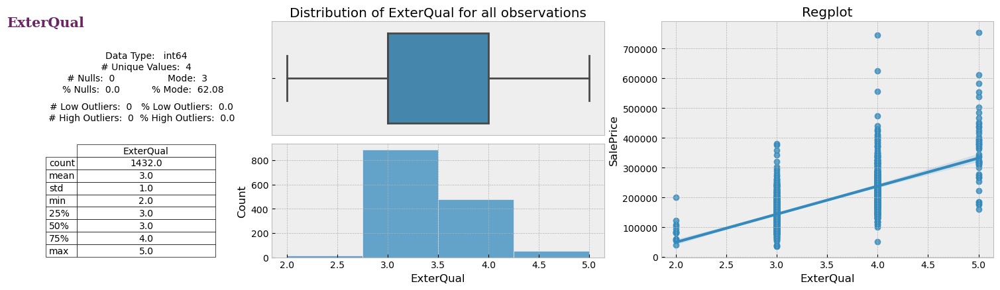

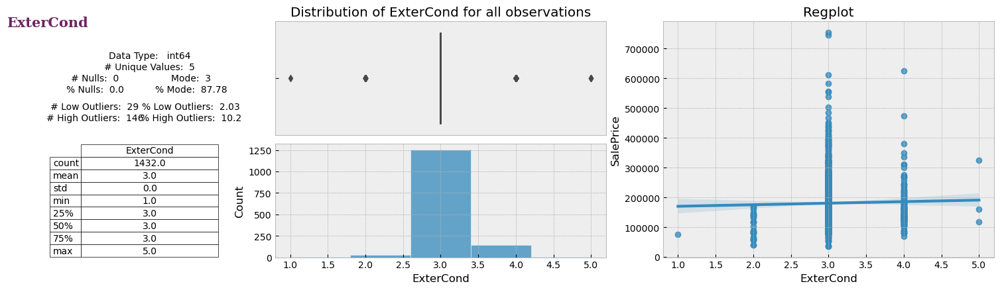

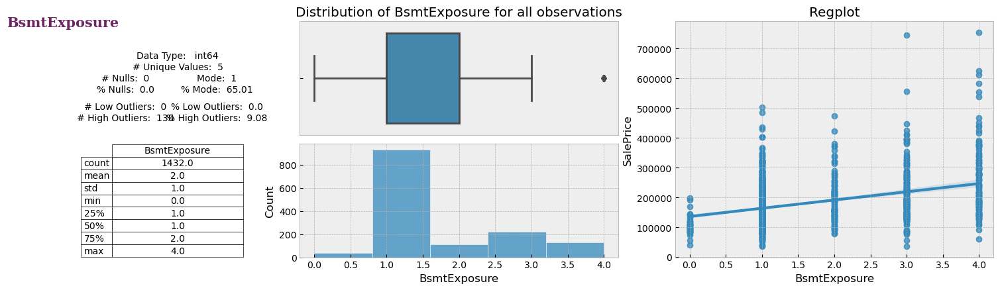

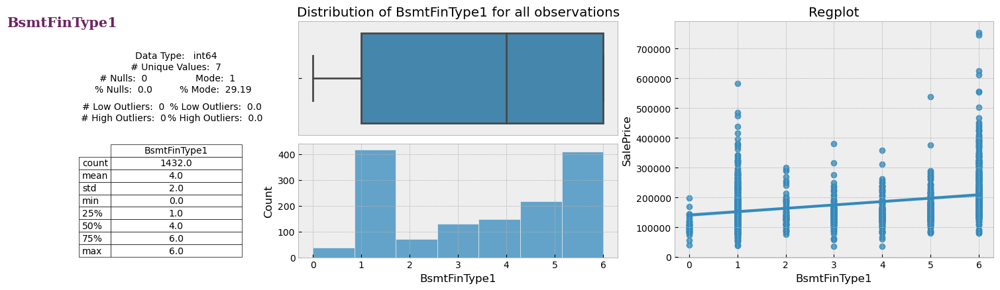

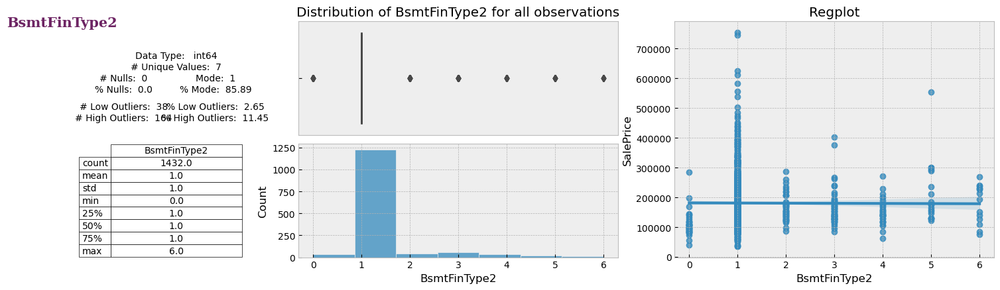

...

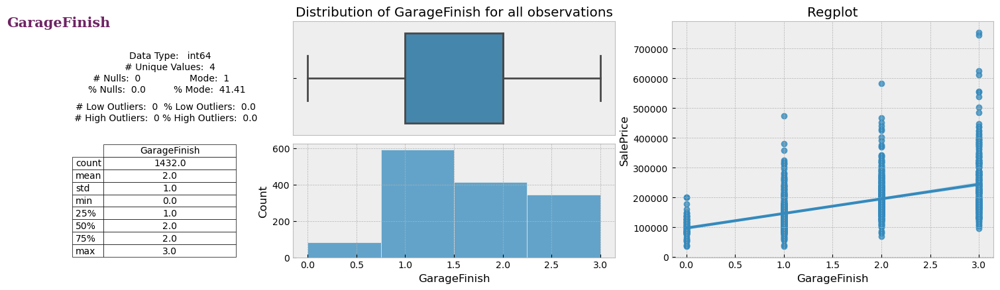

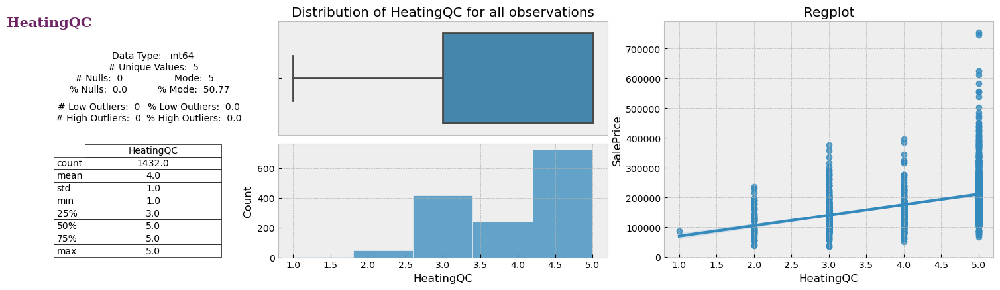

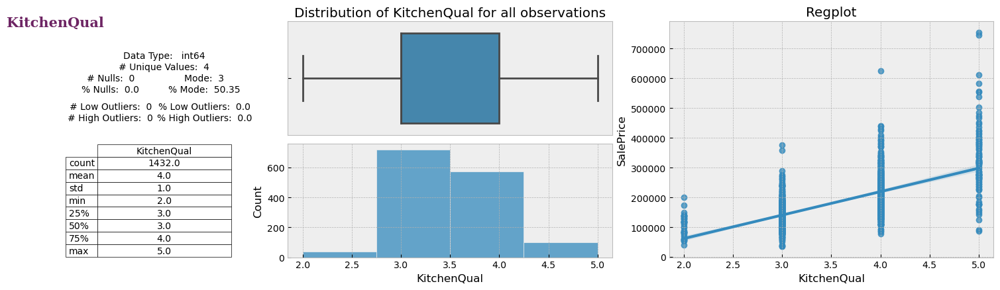

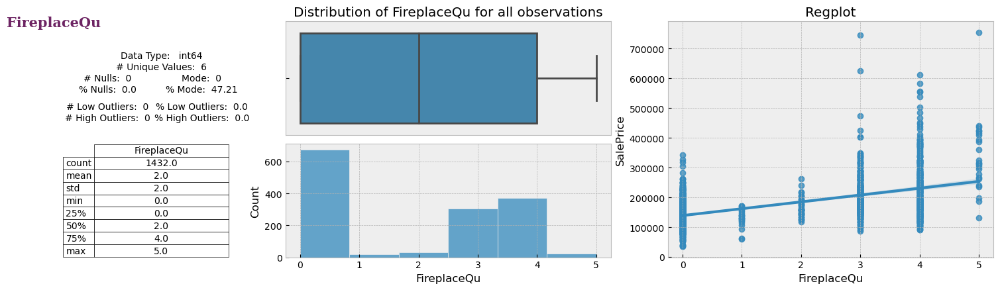

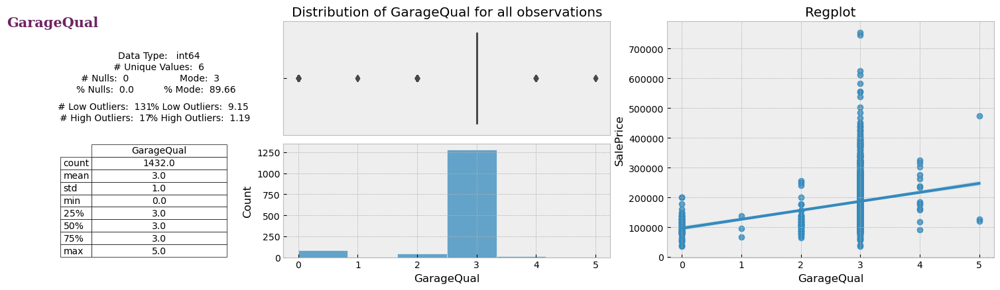

In [22]:
# let look at the new numeric fields
for col in ordinal_rating_fields:
    continuous_summary(df,col,'SalePrice')

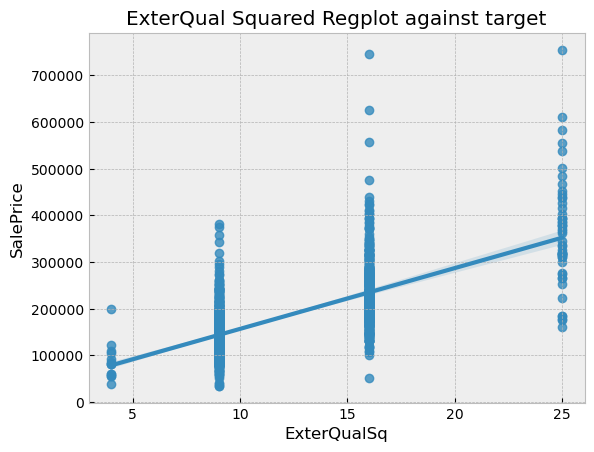

In [67]:
# Looking at some of these features ExterQual also seems to have a non-linear relationship (f(x)=x^2)
# a couple more may also but it's not as clear,  leave them for now

# The curve appears to indicate that there's a square relationship f(x)=x^2
# Lets create a new feature

square_fields = ['ExterQual']
for col in square_fields:
    df[col+'Sq'] = np.square(df[col])
    sns.regplot(df,x=col+'Sq',y='SalePrice').set(title='ExterQual Squared Regplot against target' )
    plt.show()

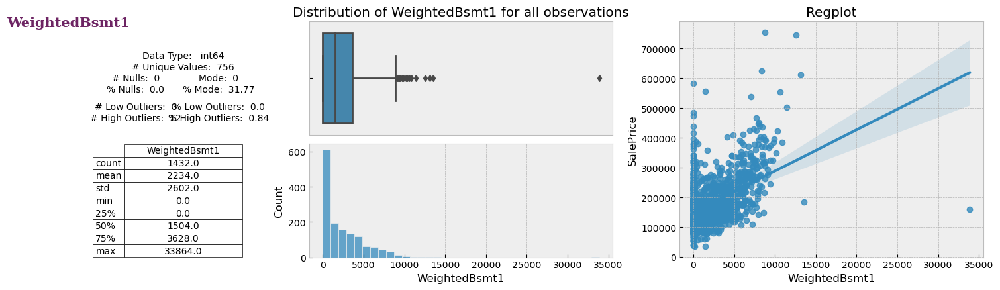

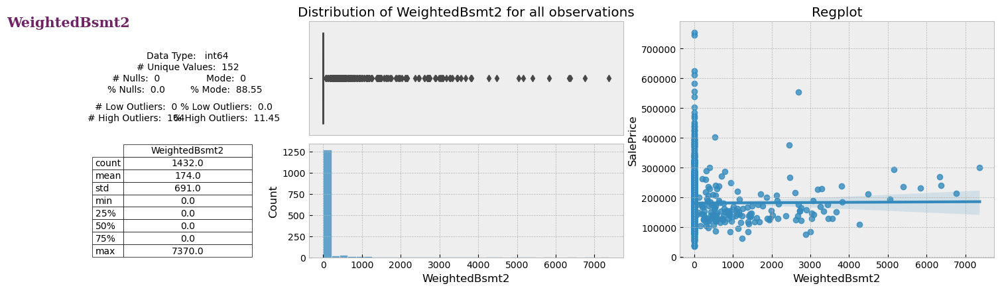

In [24]:
# looking at the basement fields, there is no way to link the size to the quality in the model
# A large unfinished basement may be less desireable than a small high quality finished basement


# Lets create a weighted field that merges the size and quality features
df['WeightedBsmt1'] = df['BsmtFinSF1'] * df['BsmtFinType1']
continuous_summary(df,'WeightedBsmt1','SalePrice')

# Lets repeat for the second basement type
df['WeightedBsmt2'] = df['BsmtFinSF2'] * df['BsmtFinType2']
continuous_summary(df,'WeightedBsmt2','SalePrice')


In [25]:
# Lets take a list of the numeric features that we will use for scaling before we add dummy features
numeric_features = []
for col in df.columns:
    if (df[col].dtype in ['int16','Int32','int64','float64']):
        numeric_features.append(col)

# lets remove the dependant variable so that doesn't get scaled
numeric_features.remove('SalePrice')

print(numeric_features)

['LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces', 'FireplaceQu', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'YrSold', 'OverallQualSq', 'TotalBath', 'ExterQualSq', 'WeightedBsmt1', 'WeightedBsmt2']


### Lets create dummy features for the categorical features



In [26]:

def CreateDummies(column_name):
    if (df[column_name].isnull().sum()== 0 ):
        # no nulls so create dummies and drop the 
        # mode value as this is deemed as the status quo
        df_dummies = pd.get_dummies(df[column_name], prefix = column_name)
        df_dummies.drop([column_name+'_'+ str(df[column_name].mode()[0])],axis=1, inplace=True)
    elif (df[column_name].isnull().sum()/len(df) < 0.1 ):
        # less than 10% null values 
        # create a null feature
        # drop the mode value as this is the status quo
        df_dummies = pd.get_dummies(df[column_name], dummy_na=True, prefix = column_name)
        df_dummies.drop([column_name+'_'+ str(df[column_name].mode()[0])], axis=1, inplace=True)
    else:
        # more than 10% null values
        # create dummies but don't drop any column
        # the nulls will stop significant multicolinearity
        df_dummies = pd.get_dummies(df[column_name], prefix = column_name)
    return df_dummies

# all categoric (object) variables in the dataset
df_categorical = df.select_dtypes(include=['object'])

# create all the dummy features
for col in df.select_dtypes(include=['object']).columns:
    # create the dummy features
    df = pd.concat([df,CreateDummies(col)], axis=1)
    # drop the categorical field
    df.drop(col,axis=1,inplace=True)



### Lets confirm that all nulls have been handled

In [27]:
def null_pct(df):
    nulls = pd.DataFrame(round((df.isnull().sum()/len(df.index)*100),4),columns=['pct_null'])
    nulls = nulls[nulls['pct_null'] > 0]
    print(nulls.sort_values(['pct_null'],ascending=False))

null_pct(df)

Empty DataFrame
Columns: [pct_null]
Index: []


### There are several year fields
### Lets change these to duration fields
#### e.g. Year Built will become property age
#### the new values will be calculated as at the year of the sale
#### e.g age = year sold - year built


In [28]:
# calulate duration fields
df['HouseAge'] = df['YrSold']-df['YearBuilt']
df['GarageAge'] = df['YrSold']-df['GarageYrBlt']
df['YrsSinceRemodAdd'] =  df['YrSold']-df['YearRemodAdd']

# For the sold date we can not calculate a duration
# instead we will set the min year sold as 0 
df['AdjYrSold'] = df.YrSold.apply(lambda x:x-df['YrSold'].min())

print(df[['YrSold','HouseAge','YearBuilt','GarageAge','GarageYrBlt','YrsSinceRemodAdd','YearRemodAdd','AdjYrSold']].head())

# drop the original features
df.drop(['YearBuilt','GarageYrBlt','YearRemodAdd','YrSold'], axis=1, inplace=True)

# remove the features from the list of numeric features
for feature in ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']:
    numeric_features.remove(feature)

# lets add the new numeric features to the numeric_features list
numeric_features.extend(['HouseAge','GarageAge','YrsSinceRemodAdd'])

   YrSold  HouseAge  YearBuilt  GarageAge  GarageYrBlt  YrsSinceRemodAdd  YearRemodAdd  AdjYrSold
0    2008         5       2003        5.0       2003.0                 5          2003          2
1    2007        31       1976       31.0       1976.0                31          1976          1
2    2008         7       2001        7.0       2001.0                 6          2002          2
3    2006        91       1915        8.0       1998.0                36          1970          0
4    2008         8       2000        8.0       2000.0                 8          2000          2


### There are way too many columns
### Lasso regression will eliminate features but it's computationally expensive
### Lets check if we can drop some features based on VIF



(46, 46)


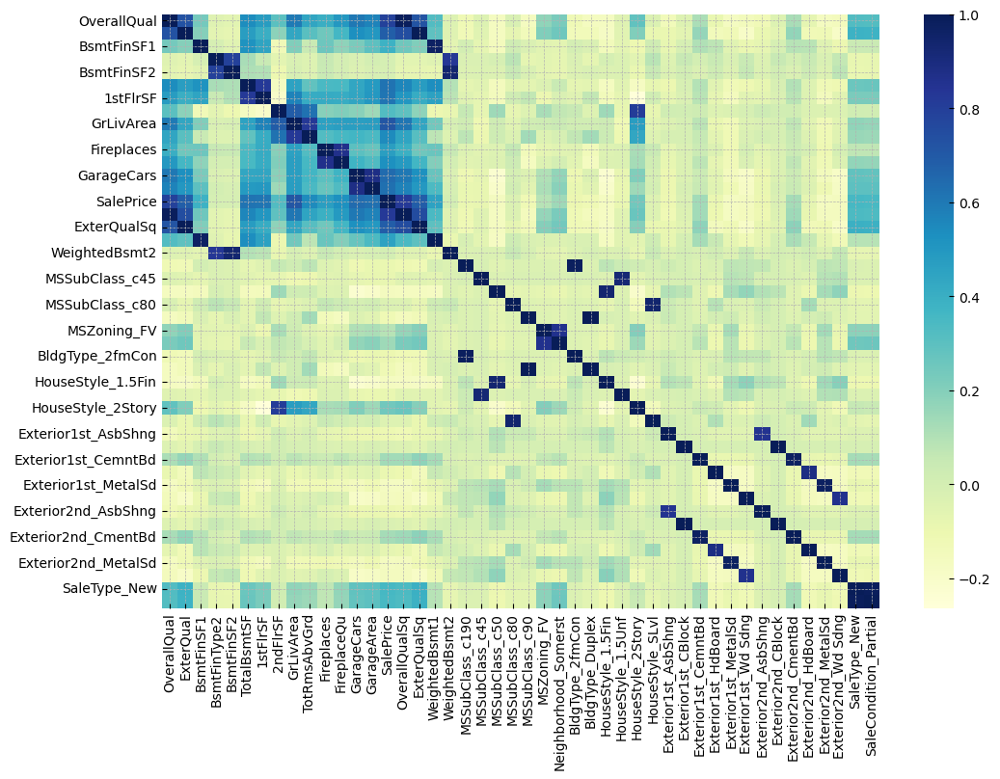

In [29]:


# figure size
plt.figure(figsize=(12,8))
cor = simplecorr(df,.8)
print(cor.shape)
sns.heatmap(cor, annot = False, cmap="YlGnBu")
plt.show()

### There are a lot of highly correlated features
### We can use RFE to reduce them down to a managable level

In [30]:


# split into train and test
from sklearn.model_selection import train_test_split

# split the data in to train and test dataframes
df_train, df_test = train_test_split(df, train_size = 0.8, test_size = 0.2, random_state = 1)

# Scale the features using the min/max scaler from scikit learn 
scaler = MinMaxScaler()

df_train[numeric_features] = scaler.fit_transform(df_train[numeric_features])
df_test[numeric_features] = scaler.transform(df_test[numeric_features])

# Split in to X and y datasets
y_train = df_train.pop('SalePrice')
X_train = df_train
y_test = df_test.pop('SalePrice')
X_test = df_test




In [31]:
# Lets check the values look ok
df_train.head()

,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageFinish,GarageCars,GarageArea,GarageQual,WoodDeckSF,OpenPorchSF,EnclosedPorch,OverallQualSq,TotalBath,ExterQualSq,WeightedBsmt1,WeightedBsmt2,MSSubClass_c120,MSSubClass_c160,MSSubClass_c180,MSSubClass_c190,MSSubClass_c30,MSSubClass_c40,MSSubClass_c45,MSSubClass_c50,MSSubClass_c60,MSSubClass_c70,MSSubClass_c75,MSSubClass_c80,MSSubClass_c85,MSSubClass_c90,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RM,LotShape_IR1,LotShape_IR2,LotShape_IR3,LandContour_Bnk,LandContour_HLS,LandContour_Low,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_Slab,Foundation_Stone,Foundation_Wood,GarageType_2Types,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,Fence_GdPrv,Fence_GdWo,Fence_MnPrv,Fence_MnWw,MoSold_Apr,MoSold_Aug,MoSold_Dec,MoSold_Feb,MoSold_Jan,MoSold_July,MoSold_Mar,MoSold_May,MoSold_Nov,MoSold_Oct,MoSold_Sep,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Partial,HouseAge,GarageAge,YrsSinceRemodAdd,AdjYrSold
1420,0.236301,0.048611,0.555556,0.625,0.304790,0.333333,0.50,0.6,0.75,0.25,0.833333,0.071580,0.166667,0.000000,0.130137,0.115876,0.75,0.077778,0.378205,0.187932,0.0,0.0,0.666667,0.5,0.375,0.333333,0.363636,0.333333,0.6,0.666667,0.50,0.547250,0.6,0.000000,0.308958,0.0,0.353535,0.375,0.238095,0.059650,0.000000,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.294574,0.345455,0.639344,0
1249,0.133562,0.027577,0.444444,0.750,0.000000,0.333333,0.50,0.6,0.75,0.25,0.666667,0.094614,0.500000,0.065129,0.105308,0.143372,0.50,0.142593,0.000000,0.105688,0.0,0.0,0.333333,0.0,0.375,0.333333,0.272727,0.000000,0.0,0.333333,0.25,0.194640,0.6,0.000000,0.146252,0.0,0.242424,0.000,0.238095,0.063076,0.039077,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

### Lets use RFE to reduce the number of fields

In [32]:
# Running RFE with the output number of the variable equal to 14
rfe = RFE(estimator=LinearRegression(), n_features_to_select=45)
rfe = rfe.fit(X_train, y_train)

list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('LotFrontage', True, 1),
 ('LotArea', True, 1),
 ('OverallQual', True, 1),
 ('OverallCond', True, 1),
 ('MasVnrArea', True, 1),
 ('ExterQual', True, 1),
 ('ExterCond', False, 23),
 ('BsmtQual', True, 1),
 ('BsmtCond', False, 99),
 ('BsmtExposure', True, 1),
 ('BsmtFinType1', False, 24),
 ('BsmtFinSF1', True, 1),
 ('BsmtFinType2', False, 20),
 ('BsmtFinSF2', False, 9),
 ('BsmtUnfSF', False, 8),
 ('TotalBsmtSF', True, 1),
 ('HeatingQC', False, 82),
 ('1stFlrSF', False, 86),
 ('2ndFlrSF', False, 25),
 ('GrLivArea', True, 1),
 ('BsmtFullBath', False, 2),
 ('BsmtHalfBath', False, 3),
 ('FullBath', True, 1),
 ('HalfBath', False, 7),
 ('BedroomAbvGr', False, 45),
 ('KitchenQual', False, 125),
 ('TotRmsAbvGrd', True, 1),
 ('Fireplaces', False, 93),
 ('FireplaceQu', False, 27),
 ('GarageFinish', False, 62),
 ('GarageCars', True, 1),
 ('GarageArea', False, 106),
 ('GarageQual', True, 1),
 ('WoodDeckSF', False, 44),
 ('OpenPorchSF', False, 127),
 ('EnclosedPorch', False, 37),
 ('OverallQualSq',

In [33]:
# Apply the feature reduction to the X datasets 
cols = X_train.columns[rfe.support_]
X_train = X_train[cols]
X_test = X_test[cols]


In [34]:
# confirm the size has changed
X_train.shape

(1145, 45)

(10, 10)


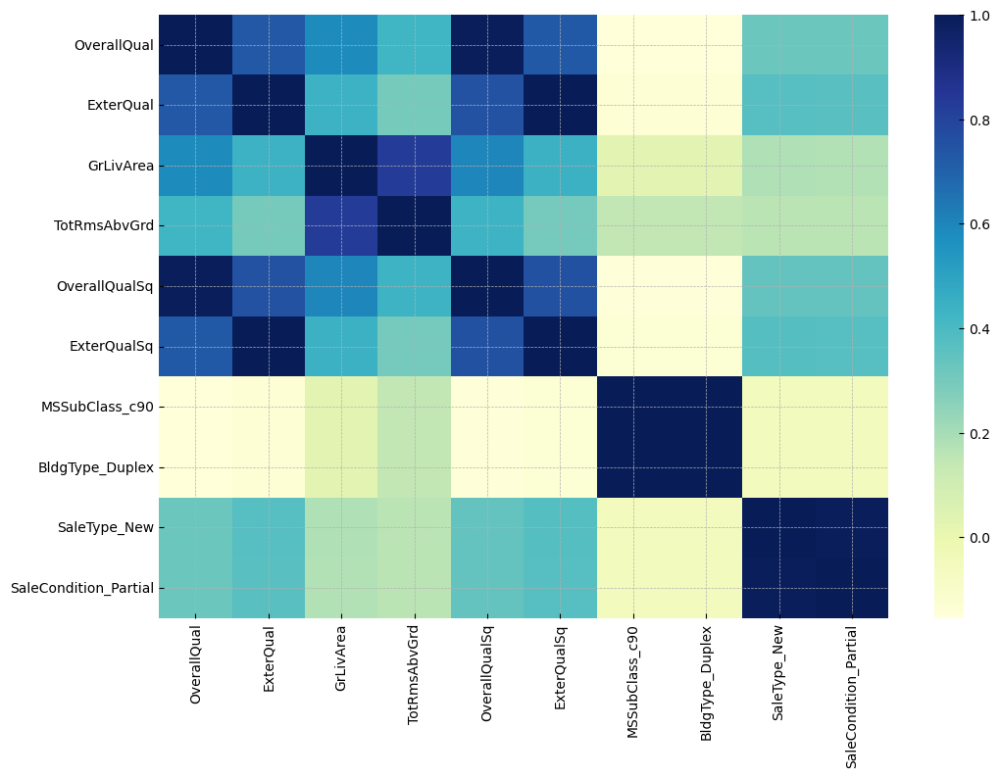

In [35]:
# figure size
plt.figure(figsize=(12,8))
cor = simplecorr(X_train,.8)
print(cor.shape)
sns.heatmap(cor, annot = False, cmap="YlGnBu")
plt.show()

In [36]:
# Lets drop more features manually due to high multicollinearity
X_train.drop(['OverallQual','ExterQual','TotRmsAbvGrd','MSSubClass_c90','SaleCondition_Partial'], axis=1, inplace=True)
X_test.drop(['OverallQual','ExterQual','TotRmsAbvGrd','MSSubClass_c90','SaleCondition_Partial'], axis=1, inplace=True)


In [37]:
# show no collinearity above 80%
cor = simplecorr(X_train,.8)
print(cor.shape)


(0, 0)


# Model creation 

For each model we will:

- Create a model
- use GridSearchCV to find the optimal value of alpha
- fit the model using optimal alpha value
- evaluate the model (R2, RSS, MSE)

# check the assumptions
The assumptions to be checked are: 

- There is a linear relationship between each predictor variable and the response  
- No Multicollinearity 
- Observations are independent 
- Homoscedasticity
- Multivariate normality

# Ridge Model

In [38]:
# list of alphas to tune - if value too high it will lead to underfitting, if it is too low, 
# it will not handle the overfitting
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50, 100, 500, 1000 ]}

# create the estimator model
ridge = Ridge()

# cross validation
folds = 5

# use GridSearchCV to fit a model for each hyperparameter
# and evaluate the results using neg_mean_absolute_error
# the optimal alpha value will be returned
model_cv_ridge = GridSearchCV(estimator = ridge, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error',  
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)  

model_cv_ridge.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [39]:
# Printing the best hyperparameter alpha
print(model_cv_ridge.best_params_['alpha'])


0.7


In [40]:
#Fitting Ridge model for the optimal alpha and printing regularized coefficients
ridge = Ridge(alpha=model_cv_ridge.best_params_['alpha'])
ridge.fit(X_train, y_train)
print(ridge.coef_)

[-50909.36478894 104986.40946789  37743.29837119  35464.95938783
  11061.52395446  23094.60814108  77400.35487794  33584.06535898
 189235.49518907  20601.24124257  58222.88609016  40104.05496251
 108882.57916228  24604.15852115  30798.35733879 -25723.69724795
 -41616.51438201 -27683.7465541  -14992.0722381  -11121.83724489
 -30150.02506759 -43466.96322751 -16162.45282712  33126.62751261
  47073.01821356  43337.25610788  17094.00783419  59195.36364558
  24848.70088683 -13595.72292092 -20156.45976725 -18455.99613999
 -21371.31567995 -18135.2104679   35745.93093158  39704.41102991
  28583.34577369 -11048.10240148  13214.35363802 -24947.97512983]


In [41]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridge.predict(X_train)
y_pred_test = ridge.predict(X_test)

metric1 = []
r2_train_lr = round(r2_score(y_train, y_pred_train),2)
print('Train R2: ',r2_train_lr)
metric1.append(r2_train_lr)

r2_test_lr = round(r2_score(y_test, y_pred_test),2)
print('Test R2: ',r2_test_lr)
metric1.append(r2_test_lr)

rss1_lr = round(np.sum(np.square(y_train - y_pred_train)),2)
print('Train RSS: ',rss1_lr)
metric1.append(rss1_lr)

rss2_lr = round(np.sum(np.square(y_test - y_pred_test)),2)
print('Test RSS: ',rss2_lr)
metric1.append(rss2_lr)

mse_train_lr = round(mean_squared_error(y_train, y_pred_train),2)
print('Train RMSE: ',mse_train_lr)
metric1.append(mse_train_lr**0.5)

rmse_test_lr = round(mean_squared_error(y_test, y_pred_test)**0.5,2)
print('Test RMSE: ',rmse_test_lr)
metric1.append(rmse_test_lr)

Train R2:  0.86
Test R2:  0.85
Train RSS:  930115523650.23
Test RSS:  330426202001.3
Train RMSE:  812327968.25
Test RMSE:  33930.97


### Lets check the linear regression assumptions

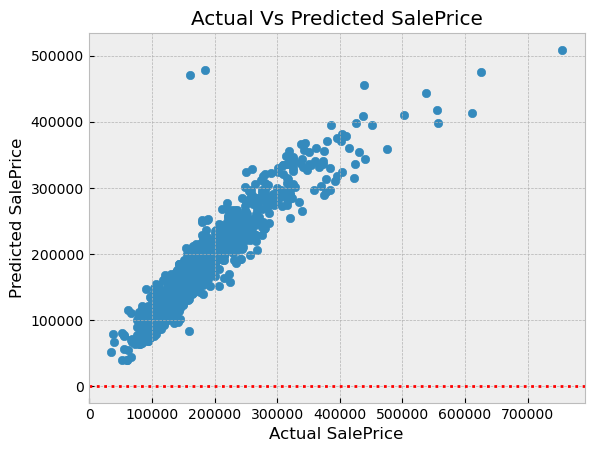

No significant correlations


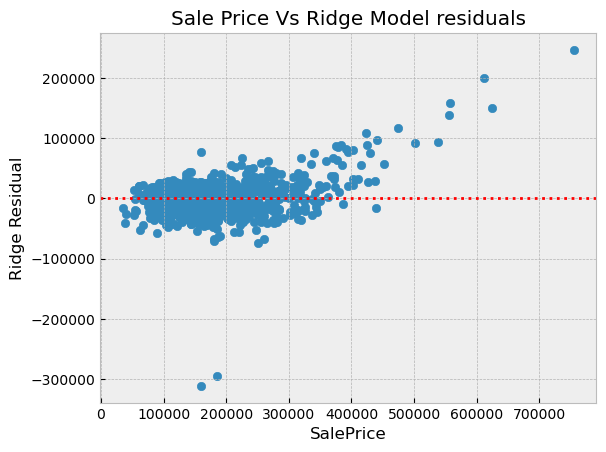

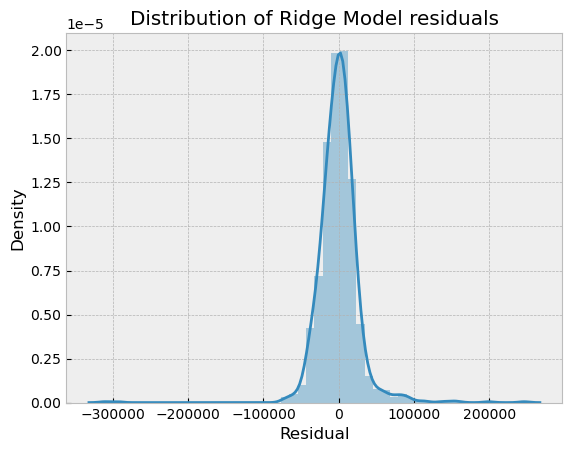

In [42]:
# linear relationship exists 
# Plot predictions against the actual
plt.scatter( x=y_train, y=y_pred_train)
plt.axhline(y=0, color='r', linestyle=':')
p = plt.title('Actual Vs Predicted SalePrice')
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.show()

# show no collinearity above 80%
cor = simplecorr(X_train,.8)
if cor.shape == (0,0):
    print('No significant correlations')
else:
    print('Significant correlations')

# Plot predictions against the residuals
y_res = y_train - y_pred_train
plt.scatter( x=y_train, y=y_res)
plt.axhline(y=0, color='r', linestyle=':')
p = plt.title('Sale Price Vs Ridge Model residuals')
plt.xlabel("SalePrice")
plt.ylabel("Ridge Residual")
plt.show()

# Distribution plot for the residuals
p = sns.distplot(y_res,kde=True)
p = plt.title('Distribution of Ridge Model residuals')
plt.xlabel('Residual')
plt.show()

### The evaluation shows:

- there is a good indication of a linear relationship between the features and the sale price
- there is no significant evidence of multicollinearity
- The residuals are not independent to the sale price.  The residuals increases for high sale prices.   
- The variance of the results is constant (but is hard to judge over $350,000) with the exception of minimal outliers
- The distribution is reasonably normal

Given more time I would look at the features again as it appears we still have some features with a non-linear relationship to the sale price.

The two outliers in the top left of the actual vs predicted saleprice plot are example of properties that appear to have sold for way below there market value
looking at these rows they are both are large properties with good overall condition.  Based on the model these properties could have provided a healthy profit 
if bought and flipped.


# Lasso Model

In [43]:
# create the estimator model
lasso = Lasso()

# use GridSearchCV to fit a model for each hyperparameter
# and evaluate the results using neg_mean_absolute_error
# the optimal alpha value will be returned
# use the same number of folds as before
model_cv_lasso = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [44]:
# Printing the best hyperparameter alpha
print(model_cv_lasso.best_params_)

{'alpha': 50}


In [45]:
#Fitting Ridge model for optimal alpha and printing regularised coefficients

lasso = Lasso(alpha=model_cv_lasso.best_params_['alpha'])
        
lasso.fit(X_train, y_train) 

lasso.coef_

array([-44952.69572772, 111092.4127782 ,  37056.95720831,  31707.65539182,
        10348.17185801,  22525.34108468,  78209.38644226,  19818.94837335,
       212375.9959727 ,  12803.91940312,  53695.67562811,  20473.33762007,
       115221.72348672,  21661.23289171,  27206.77211761, -22098.42881013,
       -39832.43674497, -19743.0105359 , -13344.44634911,  -6470.76557882,
       -24316.16400582, -43011.98157414, -16156.8551018 ,  29944.78990883,
        44051.15699423,  42447.49867149,  17242.17737741,  57023.84306876,
        21241.74898199,  -6698.39540953, -18659.01743447,     -0.        ,
       -19134.4983127 ,  -5258.00237754,  21950.77877408,   6421.62624718,
         8456.7034676 ,     -0.        ,  13053.24487015, -28824.31818956])

In [46]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric2 = []
r2_train_lr = round(r2_score(y_train, y_pred_train),2)
print('Train R2: ',r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = round(r2_score(y_test, y_pred_test),2)
print('Test R2: ',r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = round(np.sum(np.square(y_train - y_pred_train)),2)
print('Train RSS: ',rss1_lr)
metric2.append(rss1_lr)

rss2_lr = round(np.sum(np.square(y_test - y_pred_test)),2)
print('Test RSS: ',rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = round(mean_squared_error(y_train, y_pred_train),2)
print('Train RMSE: ',mse_train_lr)
metric2.append(mse_train_lr**0.5)

rmse_test_lr = round(mean_squared_error(y_test, y_pred_test)**0.5,2)
print('Test RMSE: ',rmse_test_lr)
metric2.append(rmse_test_lr)

Train R2:  0.86
Test R2:  0.86
Train RSS:  940538666663.33
Test RSS:  317829501998.36
Train RMSE:  821431149.92
Test RMSE:  33277.92


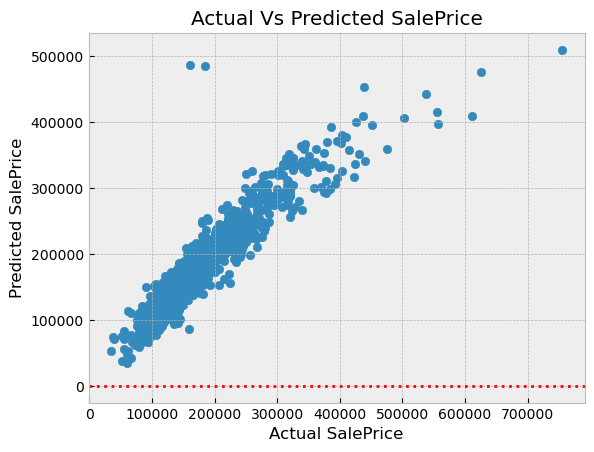

No significant correlations


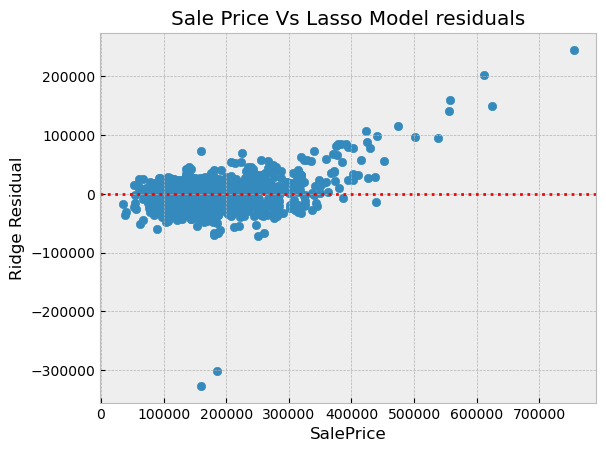

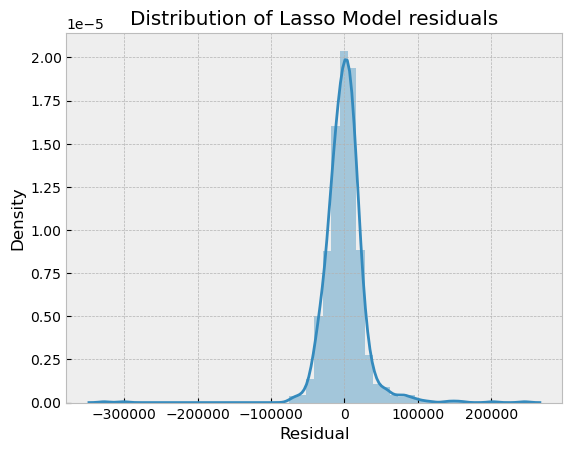

In [47]:
# linear relationship exists 
# Plot predictions against the actual
plt.scatter( x=y_train, y=y_pred_train)
plt.axhline(y=0, color='r', linestyle=':')
p = plt.title('Actual Vs Predicted SalePrice')
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.show()

# show no collinearity above 80%
cor = simplecorr(X_train,.8)
if cor.shape == (0,0):
    print('No significant correlations')
else:
    print('Significant correlations')

# Plot predictions against the residuals
y_res = y_train - y_pred_train
plt.scatter( x=y_train, y=y_res)
plt.axhline(y=0, color='r', linestyle=':')
p = plt.title('Sale Price Vs Lasso Model residuals')
plt.xlabel("SalePrice")
plt.ylabel("Ridge Residual")
plt.show()

# Distribution plot for the residuals
p = sns.distplot(y_res,kde=True)
p = plt.title('Distribution of Lasso Model residuals')
plt.xlabel('Residual')
plt.show()


### The evaluation shows the same results are the ridge model:

- there is a good indication of a linear relationship between the features and the sale price
- there is no significant evidence of multicollinearity
- The residuals are not independent to the sale price.  The residuals increases for high sale prices.   
- The variance of the results is constant (but is hard to judge over $350,000) with the exception of minimal outliers
- The distribution is reasonably normal

Given more time I would look at the features again as it appears we still have some features with a non-linear relationship to the sale price.

The same two outliers can be seen in the actual vs predicted saleprice plot.   Any supporting the theory that these could have been a good option for flipping

# Summary Stats

In [48]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'RMSE (Train)','RMSE (Test)']}

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric'] )

rg_metric = pd.Series(metric1, name = 'Ridge Regression')
ls_metric = pd.Series(metric2, name = 'Lasso Regression')

final_metric = pd.concat([lr_metric, rg_metric, ls_metric], axis = 1)

final_metric

,Metric,Ridge Regression,Lasso Regression
0,R2 Score (Train),8.600000e-01,8.600000e-01
1,R2 Score (Test),8.500000e-01,8.600000e-01
2,RSS (Train),9.301155e+11,9.405387e+11
3,RSS (Test),3.304262e+11,3.178295e+11
4,RMSE (Train),2.850137e+04,2.866062e+04
5,RMSE (Test),3.393097e+04,3.327792e+04


In [49]:
# Lets look at the top 5 coefficients
betas = pd.DataFrame(index=X_train.columns)
betas.rows = X_train.columns
betas['Ridge'] = ridge.coef_
betas['AbsRidge'] = np.abs(ridge.coef_)
betas['Lasso'] = lasso.coef_
betas['AbsLasso'] = np.abs(lasso.coef_)

pd.set_option('display.max_rows', None)
print('Top 5 ridge features')
print(betas['AbsRidge'].sort_values(ascending = False).head())
print('\n')
print('Top 5 lasso features')
print(betas['AbsLasso'].sort_values(ascending = False).head())

Top 5 ridge features
GrLivArea               189235.495189
OverallQualSq           108882.579162
LotArea                 104986.409468
BsmtFinSF1               77400.354878
Neighborhood_StoneBr     59195.363646
Name: AbsRidge, dtype: float64


Top 5 lasso features
GrLivArea               212375.995973
OverallQualSq           115221.723487
LotArea                 111092.412778
BsmtFinSF1               78209.386442
Neighborhood_StoneBr     57023.843069
Name: AbsLasso, dtype: float64


# Conclusions

- Both the Ridge and Lasso models performed well explaining 85-86% of the variance in testing
- The size of the coefficients gives an indication of how much the features can impact the sale price
- They both identified the same features as important in the same order
- The models are impacted by outliers but they were not removed as 
- The predictions have high accuracy up to a sale price of $350,000
- After this the predictions are higher than the sale price
- this indicates that there are still some non-linear relationships in the features
- Given more time a would have tried transformations on the dependant variable

# Code for subjective Questions

In [50]:
#Fitting Ridge model for alpha = 10 and printing coefficients which have been penalised
ridgeX2 = Ridge(alpha=model_cv_ridge.best_params_['alpha']*2)

ridgeX2.fit(X_train, y_train)
print(ridgeX2.coef_)

[-38653.69399009  86053.1688      36650.83895359  37641.73950256
  12880.24253371  23928.89242174  71935.52383138  35474.93339628
 169959.04237283  26071.48510385  58062.3447768   32415.58675436
 108867.17209367  27053.93287313  29194.97848182 -25357.30261071
 -40233.76593977 -25285.21214037 -13541.13675688 -11439.11511295
 -28481.78605202 -36092.00224759 -15228.51601557  32423.0505663
  47494.80162662  41846.85732707  15982.17150749  57721.23430819
  25232.731005   -12134.34600343 -19513.6872388  -13320.37785658
 -20032.60858611 -14405.43805768  29672.28910478  28452.53836953
  23758.31634826  -9225.40719386  13018.7880544  -22358.82550463]


In [51]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = ridgeX2.predict(X_train)
y_pred_test = ridgeX2.predict(X_test)

metric3 = []
r2_train_lr = round(r2_score(y_train, y_pred_train),2)
print('Train R2: ',r2_train_lr)
metric3.append(r2_train_lr)

r2_test_lr = round(r2_score(y_test, y_pred_test),2)
print('Test R2: ',r2_test_lr)
metric3.append(r2_test_lr)

rss1_lr = round(np.sum(np.square(y_train - y_pred_train)),2)
print('Train RSS: ',rss1_lr)
metric3.append(rss1_lr)

rss2_lr = round(np.sum(np.square(y_test - y_pred_test)),2)
print('Test RSS: ',rss2_lr)
metric3.append(rss2_lr)

mse_train_lr = round(mean_squared_error(y_train, y_pred_train),2)
print('Train RMSE: ',mse_train_lr)
metric3.append(mse_train_lr**0.5)

rmse_test_lr = round(mean_squared_error(y_test, y_pred_test)**0.5,2)
print('Test RMSE: ',rmse_test_lr)
metric3.append(rmse_test_lr)

Train R2:  0.86
Test R2:  0.85
Train RSS:  946208104416.44
Test RSS:  333006478323.63
Train RMSE:  826382623.94
Test RMSE:  34063.2


In [52]:
#Fitting Ridge model for alpha = 50 and printing coefficients which have been penalised

lassoX2 = Lasso(alpha=model_cv_lasso.best_params_['alpha']*2)
        
lassoX2.fit(X_train, y_train) 

Lasso(alpha=100)

In [53]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lassoX2.predict(X_train)
y_pred_test = lassoX2.predict(X_test)

metric4 = []
r2_train_lr = round(r2_score(y_train, y_pred_train),2)
print('Train R2: ',r2_train_lr)
metric4.append(r2_train_lr)

r2_test_lr = round(r2_score(y_test, y_pred_test),2)
print('Test R2: ',r2_test_lr)
metric4.append(r2_test_lr)

rss1_lr = round(np.sum(np.square(y_train - y_pred_train)),2)
print('Train RSS: ',rss1_lr)
metric4.append(rss1_lr)

rss2_lr = round(np.sum(np.square(y_test - y_pred_test)),2)
print('Test RSS: ',rss2_lr)
metric4.append(rss2_lr)

mse_train_lr = round(mean_squared_error(y_train, y_pred_train),2)
print('Train RMSE: ',mse_train_lr)
metric4.append(mse_train_lr**0.5)

rmse_test_lr = round(mean_squared_error(y_test, y_pred_test)**0.5,2)
print('Test RMSE: ',rmse_test_lr)
metric4.append(rmse_test_lr)

Train R2:  0.86
Test R2:  0.86
Train RSS:  973783041474.81
Test RSS:  315682616448.32
Train RMSE:  850465538.41
Test RMSE:  33165.33


In [54]:
# Creating a table which contain all the metrics

lr_table = {'Metric': ['R2 Score (Train)','R2 Score (Test)','RSS (Train)','RSS (Test)',
                       'MSE (Train)','MSE (Test)']}

lr_metric = pd.DataFrame(lr_table ,columns = ['Metric'] )

rg_metric = pd.Series(metric1, name = 'Ridge Regression')
rg_x2_metric = pd.Series(metric3, name = 'Ridge Regression Double Lamda')
ls_metric = pd.Series(metric2, name = 'Lasso Regression')
ls_x2_metric = pd.Series(metric4, name = 'Lasso Regression Double Lamda')

final_metric = pd.concat([lr_metric, rg_metric,rg_x2_metric, ls_metric, ls_x2_metric], axis = 1)

final_metric

,Metric,Ridge Regression,Ridge Regression Double Lamda,Lasso Regression,Lasso Regression Double Lamda
0,R2 Score (Train),8.600000e-01,8.600000e-01,8.600000e-01,8.600000e-01
1,R2 Score (Test),8.500000e-01,8.500000e-01,8.600000e-01,8.600000e-01
2,RSS (Train),9.301155e+11,9.462081e+11,9.405387e+11,9.737830e+11
3,RSS (Test),3.304262e+11,3.330065e+11,3.178295e+11,3.156826e+11
4,MSE (Train),2.850137e+04,2.874687e+04,2.866062e+04,2.916274e+04
5,MSE (Test),3.393097e+04,3.406320e+04,3.327792e+04,3.316533e+04


In [55]:
betas['ridgeX2'] = ridgeX2.coef_
betas['AbsRidgeX2'] = np.abs(ridgeX2.coef_)
betas['lassoX2'] = lassoX2.coef_
betas['AbsLassoX2'] = np.abs(lassoX2.coef_)
betas

,Ridge,AbsRidge,Lasso,AbsLasso,ridgeX2,AbsRidgeX2,lassoX2,AbsLassoX2
LotFrontage,-50909.364789,50909.364789,-44952.695728,44952.695728,-38653.693990,38653.693990,-21599.992085,21599.992085
LotArea,104986.409468,104986.409468,111092.412778,111092.412778,86053.168800,86053.168800,85975.424831,85975.424831
OverallCond,37743.298371,37743.298371,37056.957208,37056.957208,36650.838954,36650.838954,34610.432870,34610.432870
MasVnrArea,35464.959388,35464.959388,31707.655392,31707.655392,37641.739503,37641.739503,30895.563021,30895.563021
BsmtQual,11061.523954,11061.523954,10348.171858,10348.171858,12880.242534,12880.242534,11573.466437,11573.466437
BsmtExposure,23094.608141,23094.608141,22525.341085,22525.341085,23928.892422,23928.892422,22857.696708,22857.696708
BsmtFinSF1,77400.354878,77400.354878,78209.386442,78209.386442,71935.523831,71935.523831,72204.159512,72204.159512
TotalBsmtSF,33584.065359,33584.065359,19818.948373,19818.948373,35474.933396,35474.933396,11338.160633,11338.160633
GrLivArea,189235.495189,189235.495189,212375.995973,212375.995973,169959.042373,169959.042373,206911.042255,206911.042255
FullBath,20601.241243,20601.241243,12803.919403,12803.919403,26071.485104,26071.485104,13081.591628,13081.591628


In [56]:
pd.set_option('display.max_rows', None)
print('Top 5 ridge features')
print(betas['AbsRidge'].sort_values(ascending = False).head())
print('\n')
print('Top 5 lasso features')
print(betas['AbsLasso'].sort_values(ascending = False).head())
print('\n')
print('Top 5 ridge features (double lamda)')
print(betas['AbsRidgeX2'].sort_values(ascending = False).head())
print('\n')
print('Top 5 lasso features (double lamda)')
print(betas['AbsLassoX2'].sort_values(ascending = False).head())

Top 5 ridge features
GrLivArea               189235.495189
OverallQualSq           108882.579162
LotArea                 104986.409468
BsmtFinSF1               77400.354878
Neighborhood_StoneBr     59195.363646
Name: AbsRidge, dtype: float64


Top 5 lasso features
GrLivArea               212375.995973
OverallQualSq           115221.723487
LotArea                 111092.412778
BsmtFinSF1               78209.386442
Neighborhood_StoneBr     57023.843069
Name: AbsLasso, dtype: float64


Top 5 ridge features (double lamda)
GrLivArea        169959.042373
OverallQualSq    108867.172094
LotArea           86053.168800
BsmtFinSF1        71935.523831
GarageCars        58062.344777
Name: AbsRidgeX2, dtype: float64


Top 5 lasso features (double lamda)
GrLivArea               206911.042255
OverallQualSq           120577.277444
LotArea                  85975.424831
BsmtFinSF1               72204.159512
Neighborhood_StoneBr     53717.038656
Name: AbsLassoX2, dtype: float64


### Remove top 5 coefficients

- GrLivArea               212375.995973
- OverallQualSq           115221.723487
- LotArea                 111092.412778
- BsmtFinSF1               78209.386442
- Neighborhood_StoneBr     57023.843069

In [57]:
# need to go back to the pre RFE to ensure that we keep the right features
# split the data in to train and test dataframes
df_train, df_test = train_test_split(df, train_size = 0.8, test_size = 0.2, random_state = 1)

# Scale the features using the min/max scaler from scikit learn 
scaler = MinMaxScaler()

df_train[numeric_features] = scaler.fit_transform(df_train[numeric_features])
df_test[numeric_features] = scaler.transform(df_test[numeric_features])

# Split in to X and y datasets
y_train = df_train.pop('SalePrice')
X_train = df_train
y_test = df_test.pop('SalePrice')
X_test = df_test

# Drop the top 5 features for lasso with optimal alpha (and the field one of the top 5 is calculated from)
X_train.drop(['GrLivArea','OverallQualSq','LotArea','BsmtFinSF1','Neighborhood_StoneBr','OverallQual'],axis=1, inplace=True)

# Running RFE with the output number of the variable equal to 40
rfe = RFE(estimator=LinearRegression(), n_features_to_select=40)
rfe = rfe.fit(X_train, y_train)

cols = X_train.columns[rfe.support_]
X_train = X_train[cols]
X_test = X_test[cols]


(6, 6)


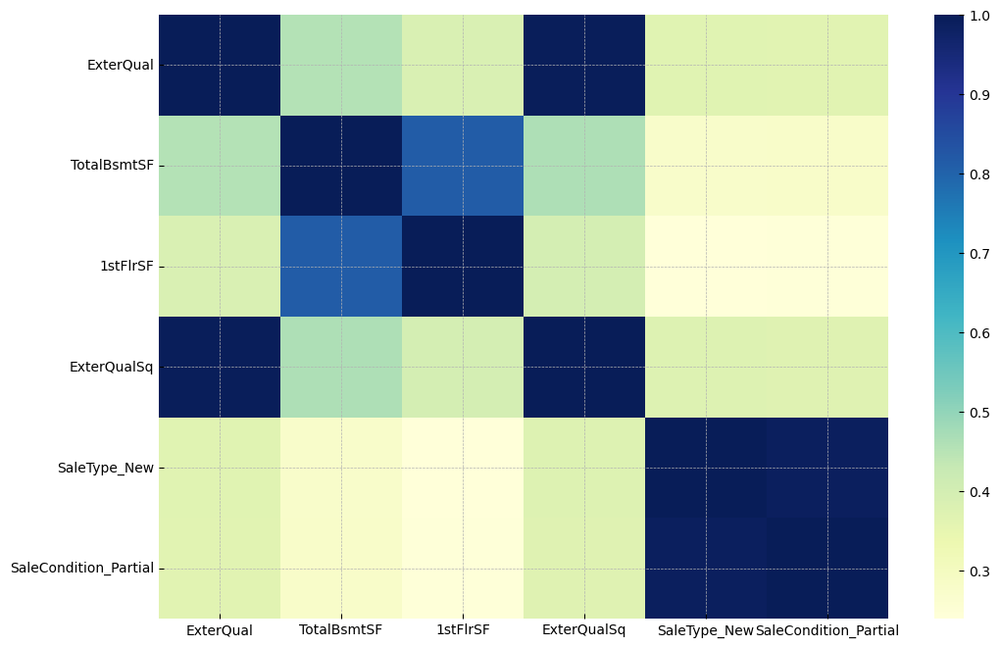

In [58]:
# figure size
plt.figure(figsize=(12,8))
cor = simplecorr(X_train,.8)
print(cor.shape)
sns.heatmap(cor, annot = False, cmap="YlGnBu")
plt.show()

In [59]:
# Lets drop 4 more features manually due to high multicollinearity
X_train.drop(['ExterQual','TotalBsmtSF','SaleCondition_Partial'], axis=1, inplace=True)
X_test.drop(['ExterQual','TotalBsmtSF','SaleCondition_Partial'], axis=1, inplace=True)

In [60]:
# show no collinearity above 80%
cor = simplecorr(X_train,.8)
print(cor.shape)


(0, 0)


In [61]:
lasso = Lasso()

# cross validation
model_cv_lasso = GridSearchCV(estimator = lasso, 
                        param_grid = params, 
                        scoring= 'neg_mean_absolute_error', 
                        cv = folds, 
                        return_train_score=True,
                        verbose = 1)            

model_cv_lasso.fit(X_train, y_train) 

Fitting 5 folds for each of 28 candidates, totalling 140 fits


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3,
                                   0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0,
                                   4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 50,
                                   100, 500, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [62]:
# Printing the best hyperparameter alpha
print(model_cv_lasso.best_params_)

{'alpha': 100}


In [63]:
#Fitting Ridge model for optimal alpha and printing coefficients which have been penalised

lasso = Lasso(alpha=model_cv_lasso.best_params_['alpha'])
        
lasso.fit(X_train, y_train) 

Lasso(alpha=100)

In [64]:
# Lets calculate some metrics such as R2 score, RSS and RMSE
y_pred_train = lasso.predict(X_train)
y_pred_test = lasso.predict(X_test)

metric2 = []
r2_train_lr = round(r2_score(y_train, y_pred_train),2)
print('Train R2: ',r2_train_lr)
metric2.append(r2_train_lr)

r2_test_lr = round(r2_score(y_test, y_pred_test),2)
print('Test R2: ',r2_test_lr)
metric2.append(r2_test_lr)

rss1_lr = round(np.sum(np.square(y_train - y_pred_train)),2)
print('Train RSS: ',rss1_lr)
metric2.append(rss1_lr)

rss2_lr = round(np.sum(np.square(y_test - y_pred_test)),2)
print('Test RSS: ',rss2_lr)
metric2.append(rss2_lr)

mse_train_lr = round(mean_squared_error(y_train, y_pred_train),2)
print('Train RMSE: ',mse_train_lr)
metric2.append(mse_train_lr**0.5)

rmse_test_lr = round(mean_squared_error(y_test, y_pred_test)**0.5,2)
print('Test RMSE: ',rmse_test_lr)
metric2.append(rmse_test_lr)

Train R2:  0.83
Test R2:  0.83
Train RSS:  1171427732423.9
Test RSS:  376087839790.03
Train RMSE:  1023080989.02
Test RMSE:  36199.59


# Get top 5 features

In [65]:
new_betas = pd.DataFrame(index=X_train.columns)
new_betas.rows = X_train.columns
new_betas['Lasso_restricted fields'] = lasso.coef_
new_betas['ABSLasso_restricted fields'] = np.abs(lasso.coef_)

In [66]:
print('Top 5 lasso features')
print(betas['AbsLasso'].sort_values(ascending = False).head())
print('\n')
print('Top 5 feature restricted lasso features')
print(new_betas['ABSLasso_restricted fields'].sort_values(ascending = False).head())

Top 5 lasso features
GrLivArea               212375.995973
OverallQualSq           115221.723487
LotArea                 111092.412778
BsmtFinSF1               78209.386442
Neighborhood_StoneBr     57023.843069
Name: AbsLasso, dtype: float64


Top 5 feature restricted lasso features
1stFlrSF       229023.768778
2ndFlrSF        63596.282972
GarageCars      59291.524368
MasVnrArea      47039.695712
ExterQualSq     46868.704299
Name: ABSLasso_restricted fields, dtype: float64
